# 선언

In [26]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchaudio

from torch.utils.data import DataLoader, Dataset, ConcatDataset

import numpy as np
import matplotlib.pyplot as plt

import os

In [27]:
device = torch.device('mps:0' if torch.backends.mps.is_available() else 'cpu')

In [28]:
print (f"PyTorch version:{torch.__version__}")
print(f"MPS 장치를 지원하도록 build 되었는지: {torch.backends.mps.is_built()}")
print(f"MPS 장치가 사용 가능한지: {torch.backends.mps.is_available()}")
!python -c 'import platform;print(platform.platform())'

PyTorch version:2.4.0
MPS 장치를 지원하도록 build 되었는지: True
MPS 장치가 사용 가능한지: True
zsh:1: command not found: python


# 데이터 전처리

1. 소음 구간 태깅

2. 데이터 분할

In [29]:
class NoiseDataset(Dataset):
    def __init__(self, audio_file, sample_rate=16000, frame_size=1024, threshold=0.05):
        waveform, orig_sample_rate = torchaudio.load(audio_file)
        self.waveform = torchaudio.transforms.Resample(orig_freq=orig_sample_rate, new_freq=sample_rate)(waveform)
        self.sample_rate = sample_rate
        self.frame_size = frame_size
        self.threshold = threshold
        self.noise_indices = self._detect_noise(self.waveform)
        
    def _detect_noise(self, waveform):
        noise_indices = []
        energy = waveform.pow(2).mean(dim=0)
        for i in range(0, waveform.size(1) - self.frame_size, self.frame_size):
            frame_energy = energy[i:i+self.frame_size].mean().item()
            if frame_energy > self.threshold:
                noise_indices.append(i)
                
        return noise_indices

    def __len__(self):
        return len(self.noise_indices)
    
    def __getitem__(self, idx):
        start_idx = self.noise_indices[idx]
        end_idx = start_idx + self.frame_size

        noisy_segment = self.waveform[:, start_idx:end_idx]
        noisy_segment = noisy_segment.unsqueeze(-1)  

        return noisy_segment, noisy_segment



# LSTM 모델

In [30]:
class AntiNoiseLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(AntiNoiseLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out)
        return out

# 학습 및 평가

In [31]:
def train_model(dataloader, model, criterion, optimizer, num_epochs = 20, validation_loader = None):
    train_losses = []
    val_losses = []

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        
        for i, (inputs, targets) in enumerate(dataloader):
            inputs = inputs.to(device)
            targets = targets.to(device)

            if inputs.dim() == 2: 
                inputs = inputs.unsqueeze(1) 
            elif inputs.dim() == 4:  
                inputs = inputs.squeeze(-1) 
            elif inputs.dim() != 3: 
                raise ValueError(f"Unexpected input dimension {inputs.dim()} with shape {inputs.shape}")

            inputs = inputs.float()
            targets = -inputs
            outputs = model(inputs)
            loss = criterion(outputs, targets)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item()

            if (i + 1) % 10 == 0:
                print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(dataloader)}], Loss: {loss.item():.4f}')
        
        epoch_loss = running_loss / len(dataloader)
        train_losses.append(epoch_loss)

        if validation_loader is not None:
            val_loss = evaluate_model(validation_loader, model, criterion)
            val_losses.append(val_loss)
            print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss:.4f}, Validation Loss: {val_loss:.4f}')
        else:
            print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss:.4f}')
    
    return train_losses, val_losses



def evaluate_model(dataloader, model, criterion):
    model.eval()
    total_loss = 0
    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs = inputs.unsqueeze(-1).float()
            targets = targets.unsqueeze(-1).float()

            outputs = model(inputs)
            outputs = outputs.unsqueeze(-1)
            loss = criterion(outputs, targets)
            total_loss += loss.item()
    
    return total_loss / len(dataloader)

# 파라미터 선언

In [32]:
val = {
    'input_size' : 1024,
    'hidden_size' : 512,
    'num_layers' : 2,
    'output_size' : 1024,
    'learning_rate' : 0.01
}

# 데이터 불러오기

In [34]:
def load_datasets_from_folder(folder_path, sample_rate=16000, frame_size=1024, threshold=0.05):
    datasets = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith(".wav"):
            audio_file_path = os.path.join(folder_path, file_name)
            dataset = NoiseDataset(audio_file_path, sample_rate, frame_size, threshold)
            datasets.append(dataset)
    combined_dataset = ConcatDataset(datasets)
    return combined_dataset

folder_path = '/Users/chonakyung/Library/CloudStorage/GoogleDrive-whskrud1007@gmail.com/내 드라이브/136-2.극한 소음 환경 소리 데이터/01-1.정식개방데이터/Validation/01.원천데이터/VS_02.공사장_03.전자제품및생활환경소리'
combined_dataset = load_datasets_from_folder(folder_path)

dataloader = DataLoader(combined_dataset, batch_size = 64, shuffle=True)

# 모델, 손실 함수, 옵티마이저 초기화

In [35]:
anti_noise_model = AntiNoiseLSTM(val['input_size'], val['hidden_size'], val['num_layers'], val['output_size'])
criterion = nn.MSELoss()
optimizer = optim.Adam(anti_noise_model.parameters(), lr = val['learning_rate'])

# 학습

In [36]:
train_model(dataloader, anti_noise_model, criterion, optimizer)

Epoch [1/20], Step [10/93], Loss: 0.0426
Epoch [1/20], Step [20/93], Loss: 0.0376
Epoch [1/20], Step [30/93], Loss: 0.0300
Epoch [1/20], Step [40/93], Loss: 0.0292
Epoch [1/20], Step [50/93], Loss: 0.0229
Epoch [1/20], Step [60/93], Loss: 0.0228
Epoch [1/20], Step [70/93], Loss: 0.0250
Epoch [1/20], Step [80/93], Loss: 0.0258
Epoch [1/20], Step [90/93], Loss: 0.0238
Epoch [1/20], Train Loss: 0.0315
Epoch [2/20], Step [10/93], Loss: 0.0214
Epoch [2/20], Step [20/93], Loss: 0.0204
Epoch [2/20], Step [30/93], Loss: 0.0207
Epoch [2/20], Step [40/93], Loss: 0.0165
Epoch [2/20], Step [50/93], Loss: 0.0182
Epoch [2/20], Step [60/93], Loss: 0.0214
Epoch [2/20], Step [70/93], Loss: 0.0207
Epoch [2/20], Step [80/93], Loss: 0.0223
Epoch [2/20], Step [90/93], Loss: 0.0208
Epoch [2/20], Train Loss: 0.0205
Epoch [3/20], Step [10/93], Loss: 0.0180
Epoch [3/20], Step [20/93], Loss: 0.0183
Epoch [3/20], Step [30/93], Loss: 0.0219
Epoch [3/20], Step [40/93], Loss: 0.0208
Epoch [3/20], Step [50/93], Loss

KeyboardInterrupt: 

# 모델 저장

In [14]:
import pickle

anti_noise_model.to('cpu')

with open('Noise_Lower_LSTM_vol_1.pkl', 'wb') as f:
    pickle.dump(anti_noise_model, f)

# 테스트

In [37]:
def evaluate_and_plot_with_dataloader(model, dataloader):
    model.eval()
    for inputs, _ in dataloader:
        inputs = inputs.to(device)
        inputs = inputs.squeeze(-1).float()
        with torch.no_grad():
            outputs = model(inputs)
            
        input_waveform = inputs[0].cpu().numpy().flatten()
        output_waveform = outputs[0].cpu().numpy().flatten()

        print(f"Input waveform shape: {input_waveform.shape}")
        print(f"Output waveform shape: {output_waveform.shape}")
        print(f"Input waveform first 10 values: {input_waveform[:10]}")
        print(f"Output waveform first 10 values: {output_waveform[:10]}")

        
        plt.figure(figsize=(14, 6))
        plt.plot(input_waveform, label='Original Noise')
        plt.plot(output_waveform, label='Predicted Anti-Noise', color='orange', alpha=0.7)
        plt.title('Original Noise vs Predicted Anti-Noise')
        plt.legend()
        plt.show()


# 테스트 실행

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.08828627 0.1525846  0.16384934 0.0949375  0.10208732 0.1552738
 0.18354064 0.13145983 0.085187   0.12762105]
Output waveform first 10 values: [-0.17294571 -0.1850311  -0.19870916 -0.2072541  -0.19364908 -0.17473856
 -0.16844343 -0.18371624 -0.15754004 -0.14719881]


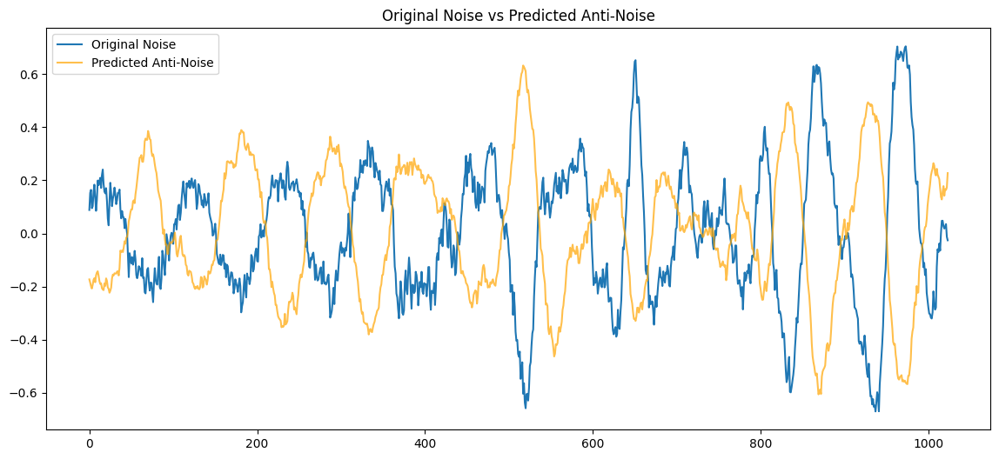

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.2783475  0.25297546 0.25014982 0.23842579 0.22721756 0.16781789
 0.1734242  0.08002122 0.0738266  0.10538939]
Output waveform first 10 values: [-0.17982095 -0.15175422 -0.1614495  -0.15806442 -0.1611641  -0.1541906
 -0.15254009 -0.1451421  -0.13282903 -0.11757408]


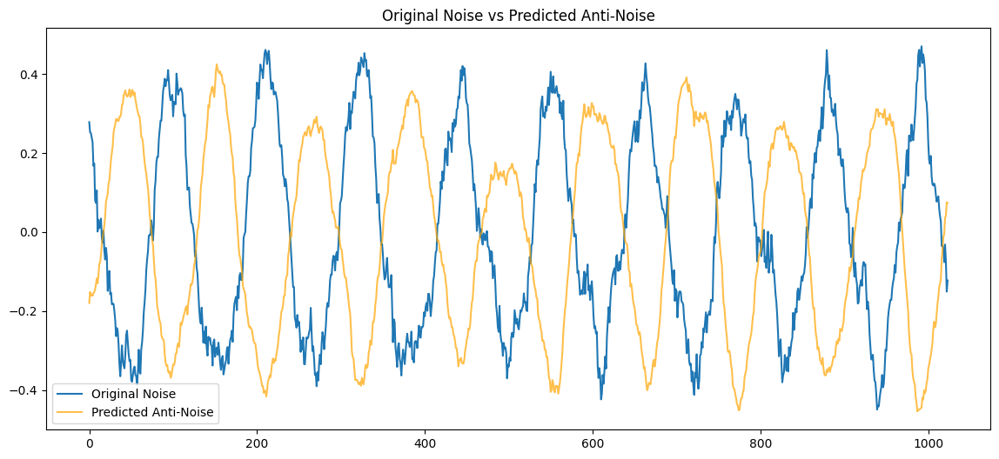

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.05211    0.03933365 0.04380044 0.05410949 0.06654347 0.05832106
 0.04146503 0.05006984 0.04327441 0.02791324]
Output waveform first 10 values: [0.12111576 0.1323798  0.12343408 0.07794969 0.0554489  0.05145098
 0.0624003  0.02755801 0.03237378 0.02447228]


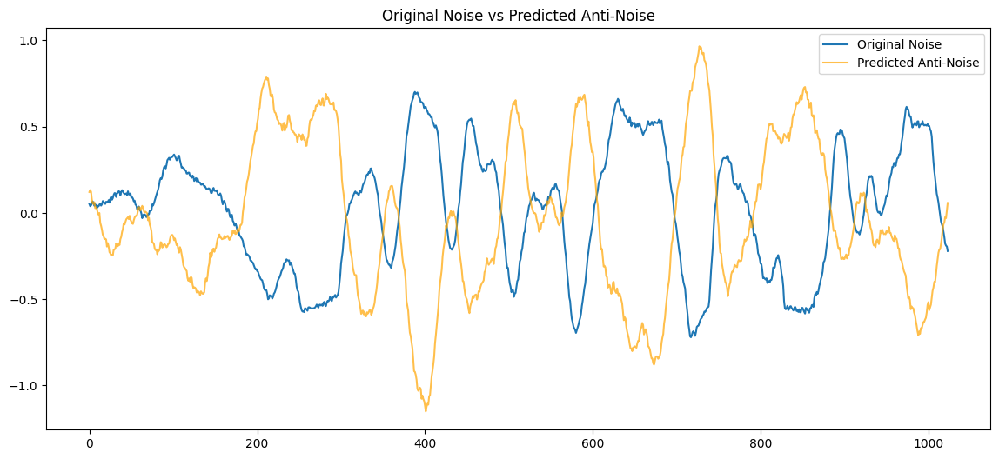

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.18790466 0.19813257 0.16612713 0.17627877 0.15620145 0.16962367
 0.12320768 0.08128385 0.07967751 0.03424546]
Output waveform first 10 values: [-0.1993621  -0.15997177 -0.15949972 -0.14876215 -0.1484318  -0.14745958
 -0.13511932 -0.12073385 -0.10644749 -0.08647308]


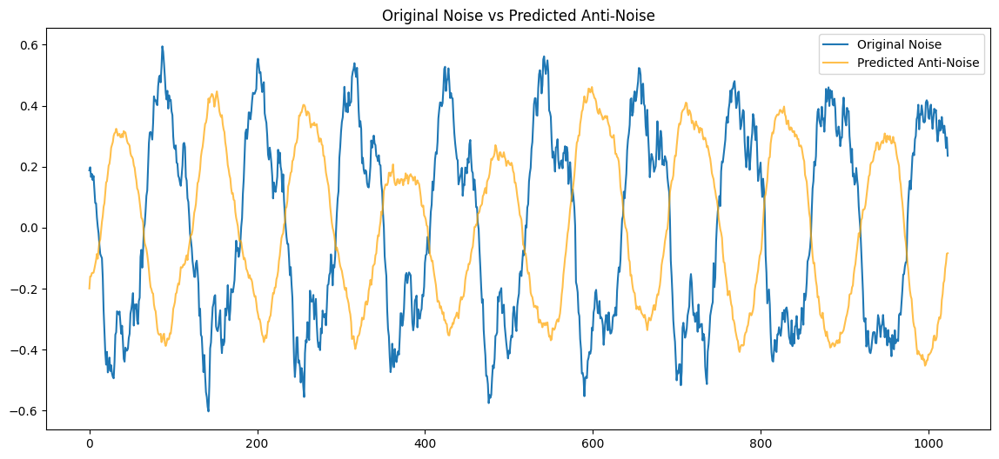

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.3972819  -0.4045751  -0.44253132 -0.40800115 -0.37009308 -0.3765633
 -0.33063808 -0.31643385 -0.30249044 -0.36544386]
Output waveform first 10 values: [0.27716693 0.2709602  0.28070703 0.3061046  0.2896666  0.30400226
 0.33710647 0.35281527 0.359359   0.35642833]


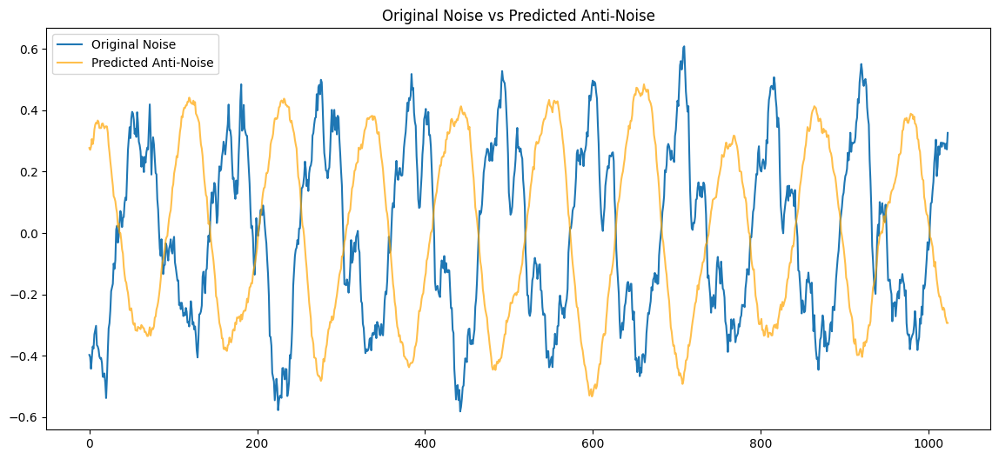

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.4249809  -0.40162846 -0.380517   -0.3644722  -0.35827446 -0.35350454
 -0.36055785 -0.3708899  -0.37075713 -0.3975174 ]
Output waveform first 10 values: [0.3316368  0.33208096 0.31849918 0.34671947 0.35259554 0.34347048
 0.35925692 0.3718608  0.3812788  0.39417988]


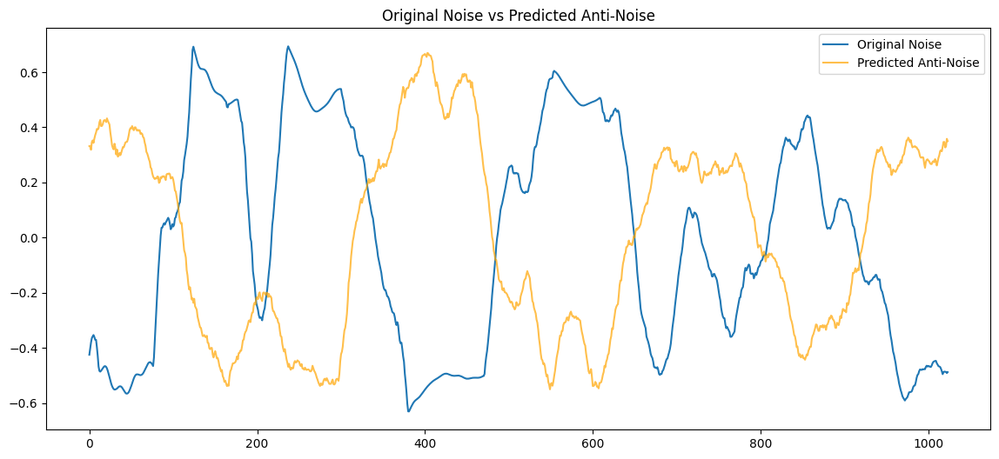

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.23597616 -0.28241017 -0.2949024  -0.39863947 -0.39893228 -0.40910453
 -0.47321343 -0.48712873 -0.47912425 -0.4786401 ]
Output waveform first 10 values: [0.21064192 0.22560686 0.23897903 0.2663904  0.29079083 0.32206342
 0.33125755 0.35993692 0.41381225 0.4384789 ]


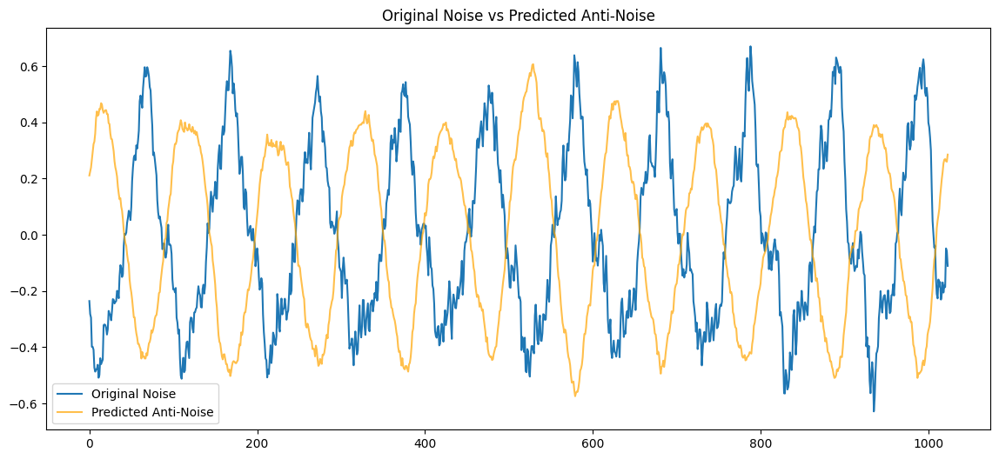

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.08420541 0.09755026 0.08754611 0.08042566 0.06674366 0.04864702
 0.0518715  0.05210097 0.06654424 0.05119449]
Output waveform first 10 values: [-0.1448498  -0.17082442 -0.17302275 -0.18827075 -0.19698514 -0.19310081
 -0.19956633 -0.1945063  -0.17942679 -0.17918696]


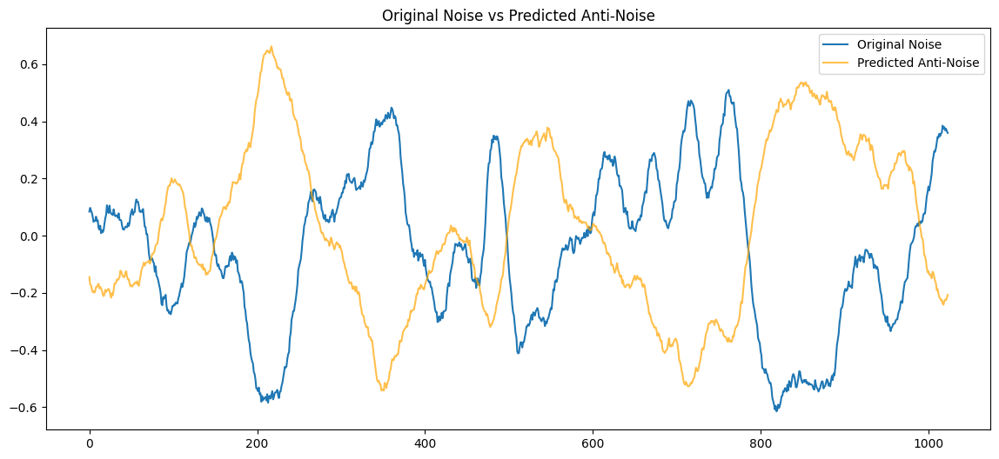

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.02343673 0.02380606 0.02452833 0.02557196 0.02658994 0.02685663
 0.02696917 0.02715032 0.02743419 0.02759863]
Output waveform first 10 values: [0.07568124 0.05796847 0.07518642 0.07892644 0.06989759 0.07078553
 0.06109381 0.02440629 0.03082286 0.03104072]


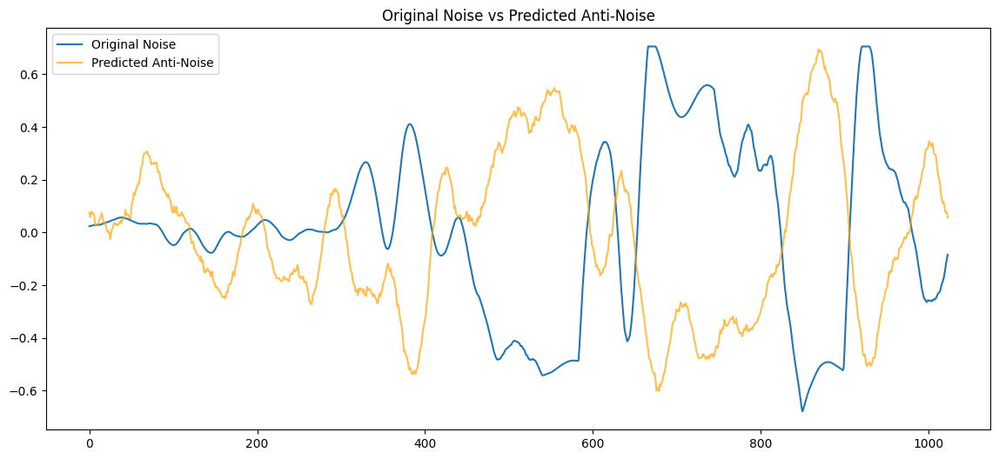

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.0630075  0.08231239 0.10157251 0.12251639 0.1437266  0.16279235
 0.18022992 0.19671619 0.2126212  0.22683625]
Output waveform first 10 values: [-0.06545523 -0.07833525 -0.08528022 -0.08976437 -0.11044638 -0.13095054
 -0.13673344 -0.16494144 -0.16691494 -0.17592782]


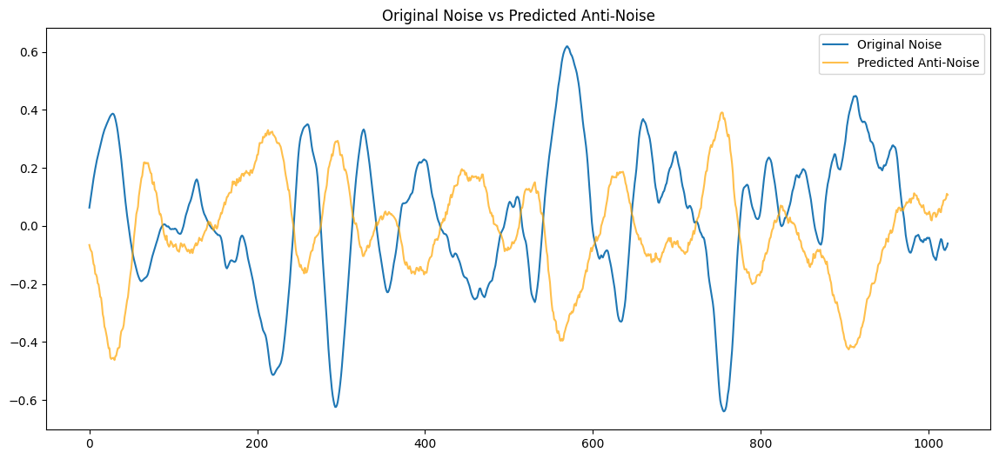

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.2182231  -0.19851676 -0.20796345 -0.20965242 -0.20538628 -0.23576139
 -0.2154905  -0.19233423 -0.2095178  -0.22313732]
Output waveform first 10 values: [0.15395835 0.14227656 0.12487604 0.12192297 0.11369492 0.10232365
 0.09543257 0.09072297 0.10105842 0.08641431]


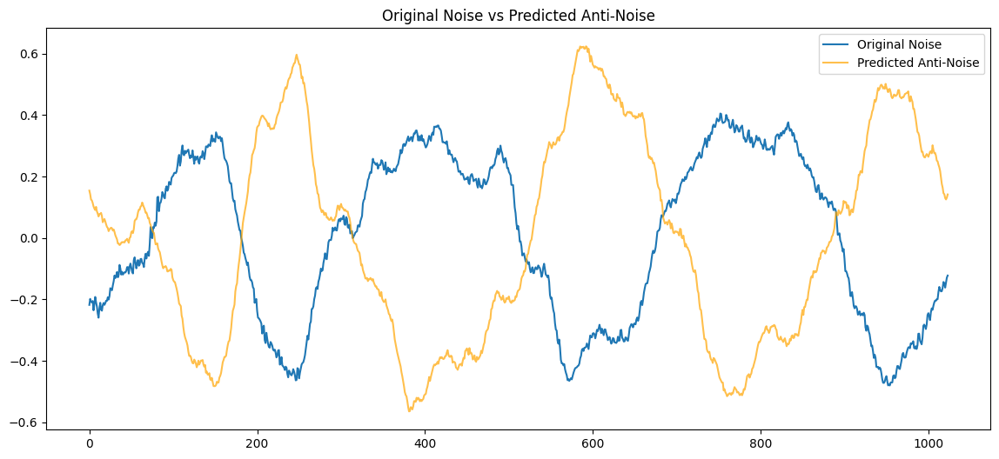

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.07267559 0.09497641 0.1124125  0.10196626 0.09950455 0.10468719
 0.119663   0.13191794 0.11229219 0.12283738]
Output waveform first 10 values: [-0.05726926 -0.07300893 -0.07076408 -0.07592814 -0.09303515 -0.10041541
 -0.10122467 -0.10620373 -0.09361674 -0.0910369 ]


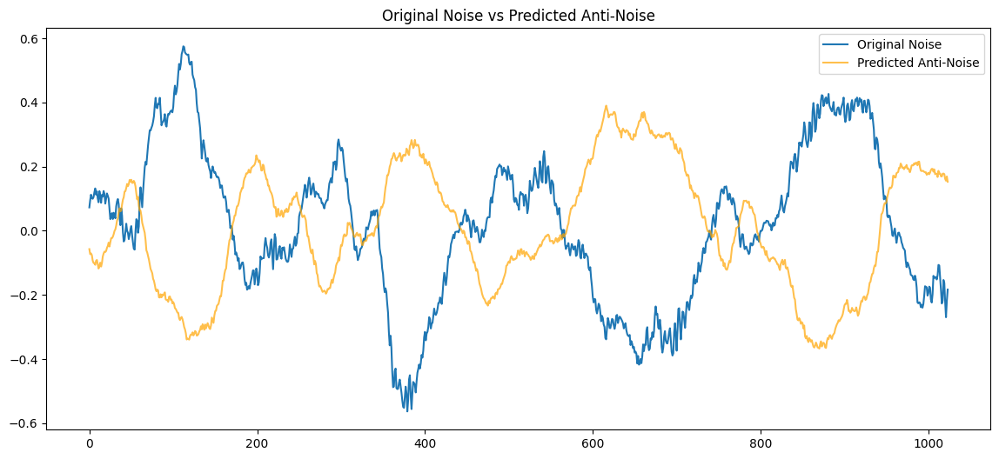

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.03895478  0.0009095   0.06069881 -0.00432739  0.08386625  0.18203165
  0.37703875  0.5487676   0.57518643  0.4451007 ]
Output waveform first 10 values: [-0.06373442 -0.05754102 -0.05497344 -0.0440668  -0.04894247 -0.0443756
 -0.03467428 -0.02859425 -0.03096722 -0.0278674 ]


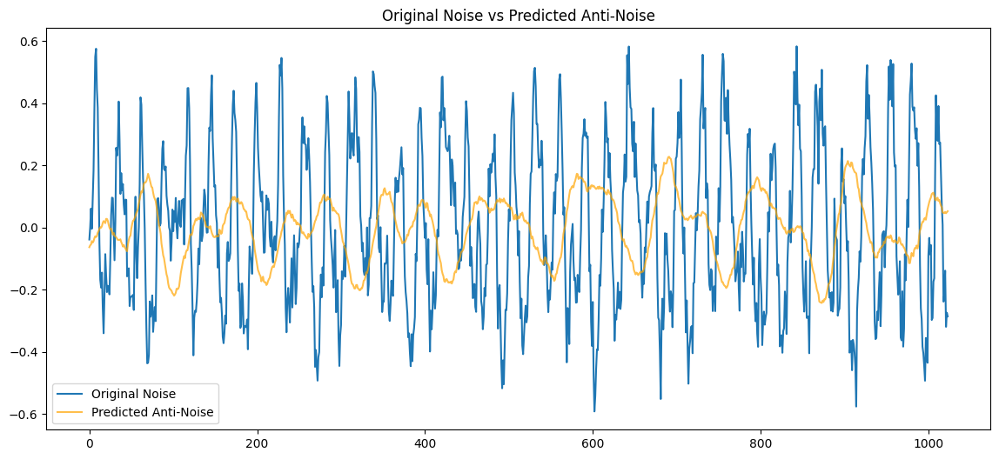

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.5935835  0.6191291  0.6312931  0.6336141  0.6259691  0.622351
 0.61645406 0.6133257  0.6088992  0.60621625]
Output waveform first 10 values: [-0.36320436 -0.39047915 -0.3945025  -0.41456512 -0.42284682 -0.42676124
 -0.45916593 -0.4859749  -0.47587854 -0.49641514]


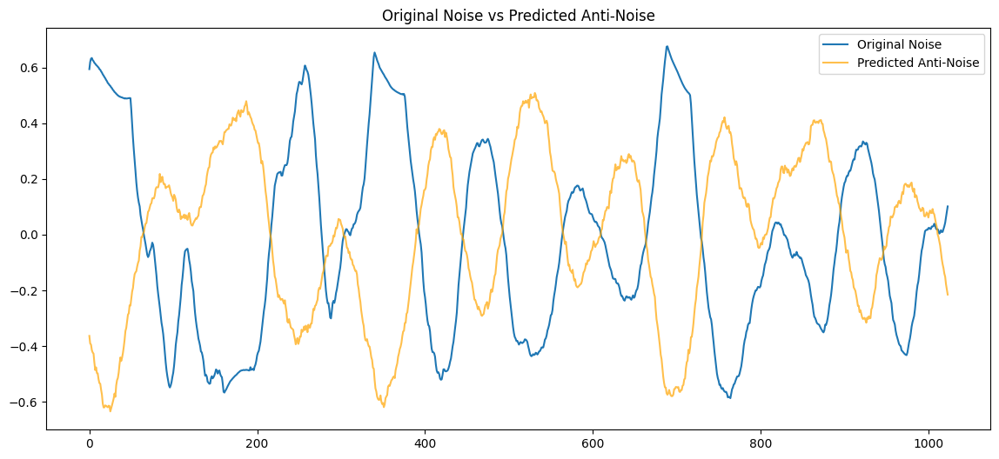

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.38400105 0.4012428  0.32359278 0.27915767 0.3013501  0.32013378
 0.34012395 0.2623882  0.2470488  0.28258905]
Output waveform first 10 values: [-0.33826995 -0.3360098  -0.33828166 -0.32852748 -0.3130145  -0.31077975
 -0.31364533 -0.30789772 -0.29291347 -0.28075784]


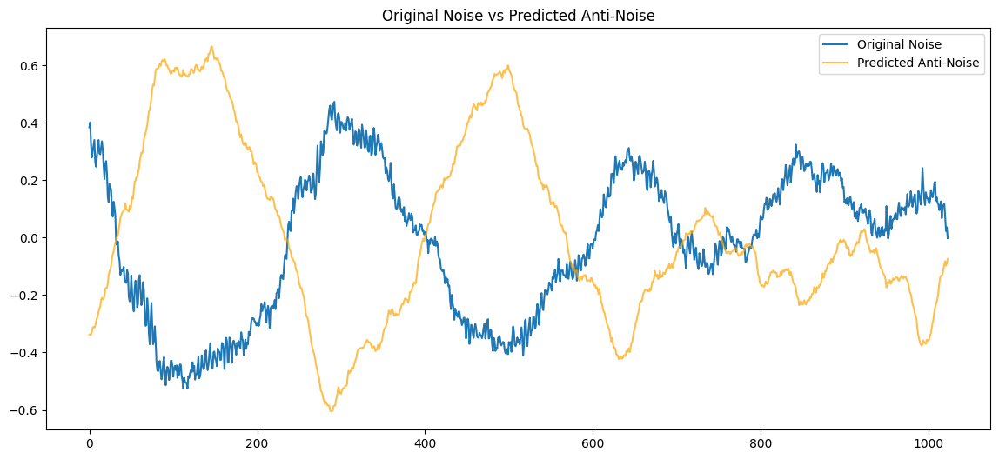

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.25020364 0.26185554 0.27489543 0.2955721  0.30855364 0.3240914
 0.33778173 0.35407084 0.36603752 0.37563005]
Output waveform first 10 values: [-0.338074   -0.35093552 -0.37196997 -0.3856482  -0.40921733 -0.40655234
 -0.42321342 -0.44667724 -0.4492222  -0.4692067 ]


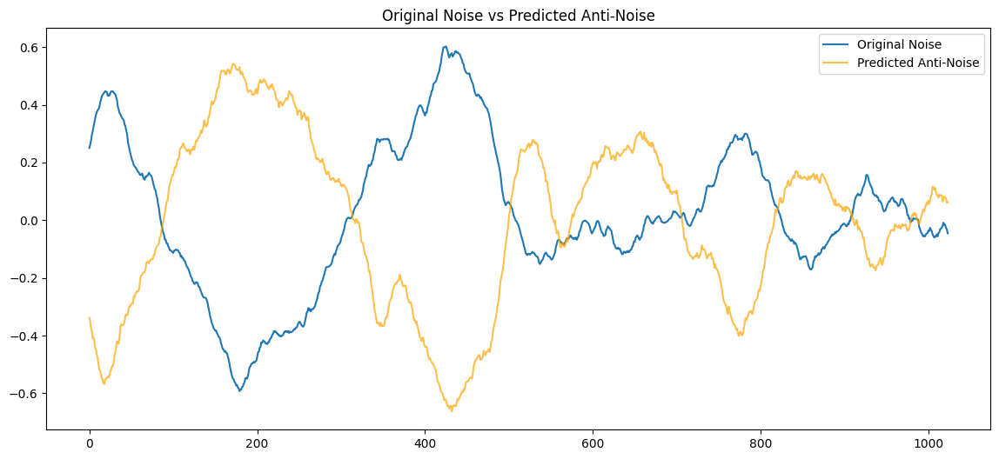

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.36189365 0.36502466 0.36412242 0.35693488 0.33752328 0.33057597
 0.30985904 0.3240846  0.34905943 0.32557696]
Output waveform first 10 values: [-0.33533484 -0.34333295 -0.34211978 -0.3341797  -0.33419627 -0.32463875
 -0.33730945 -0.3335495  -0.3140224  -0.30596215]


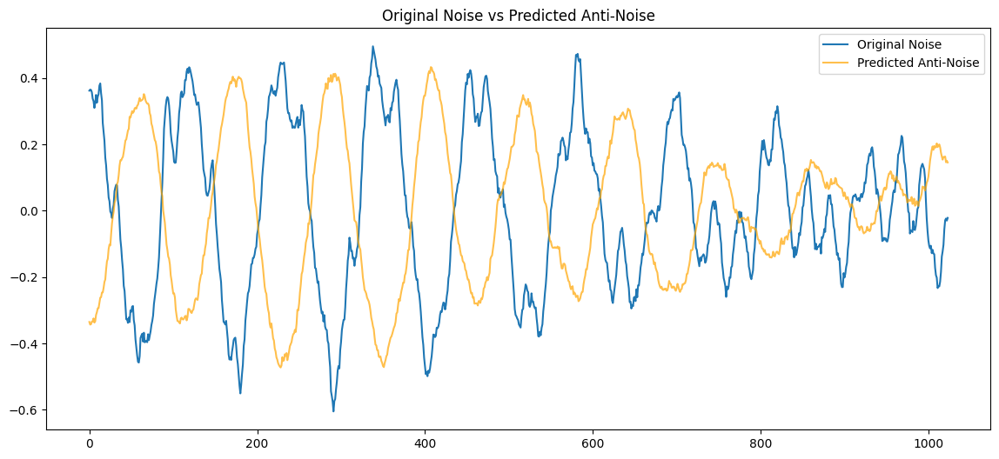

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.09177909 0.14855418 0.20957695 0.17509344 0.11191995 0.08087015
 0.08899376 0.08102735 0.04704171 0.05758602]
Output waveform first 10 values: [-0.12511477 -0.11996166 -0.11787456 -0.13484767 -0.15522237 -0.17226522
 -0.1752178  -0.17762132 -0.17015517 -0.17810716]


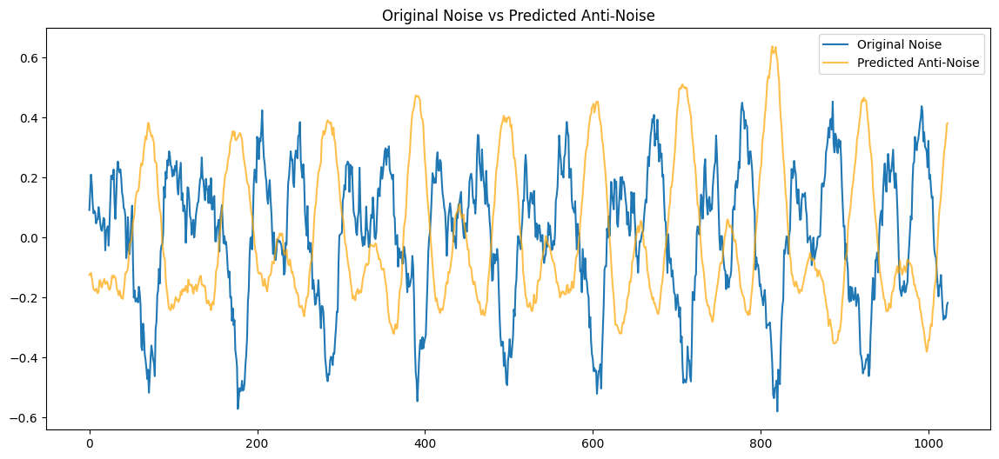

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.399313   -0.4133301  -0.41267648 -0.4025529  -0.4087443  -0.4224435
 -0.42220837 -0.4163852  -0.39578107 -0.37488216]
Output waveform first 10 values: [0.07616249 0.09014757 0.10834545 0.14158896 0.16897252 0.1841119
 0.19822764 0.20915519 0.22525616 0.26063275]


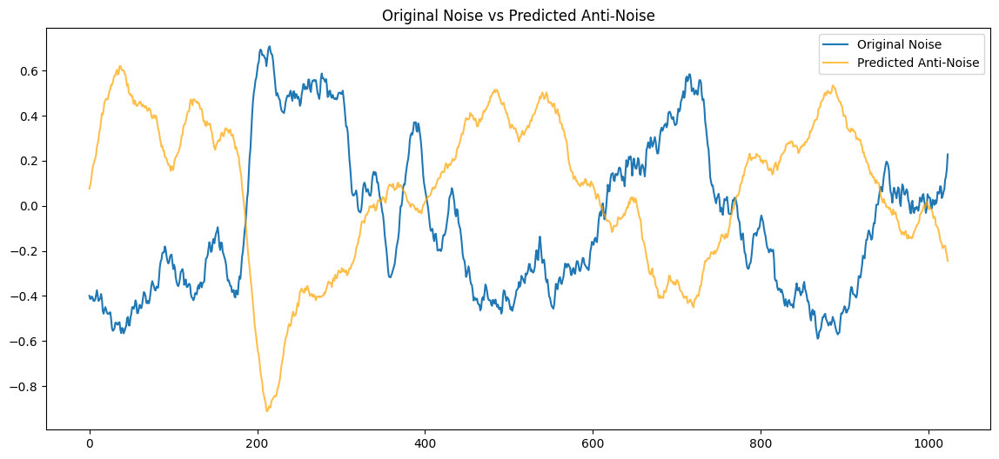

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.148884   0.19090071 0.15491235 0.1443234  0.11061596 0.15120684
 0.10430488 0.10836674 0.17310522 0.13963658]
Output waveform first 10 values: [-0.0918697  -0.09833013 -0.10441969 -0.12290139 -0.1495588  -0.16817348
 -0.15968291 -0.16858537 -0.15960625 -0.16595702]


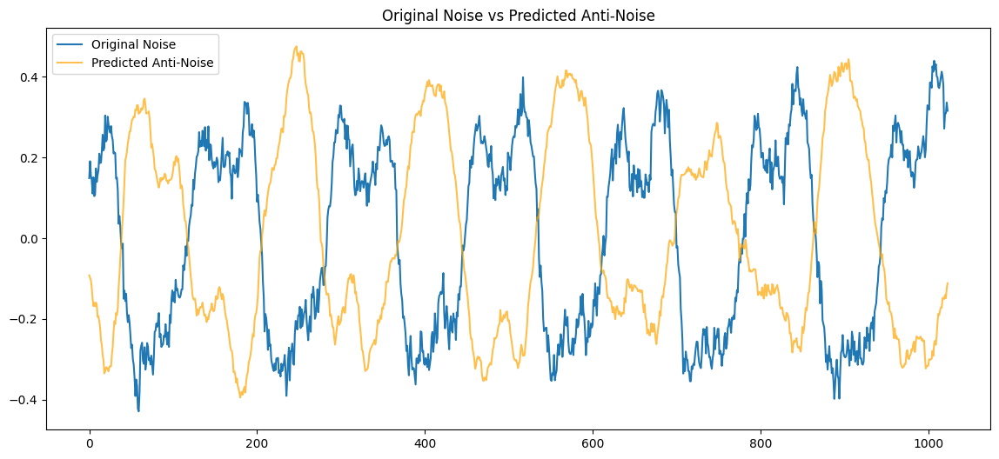

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.47698998 0.4920605  0.46466586 0.46863505 0.47283787 0.4367176
 0.42434543 0.4049965  0.3494989  0.3351821 ]
Output waveform first 10 values: [-0.31260195 -0.3231116  -0.3107616  -0.2929803  -0.27787635 -0.28586382
 -0.25451392 -0.25543436 -0.22182424 -0.20098093]


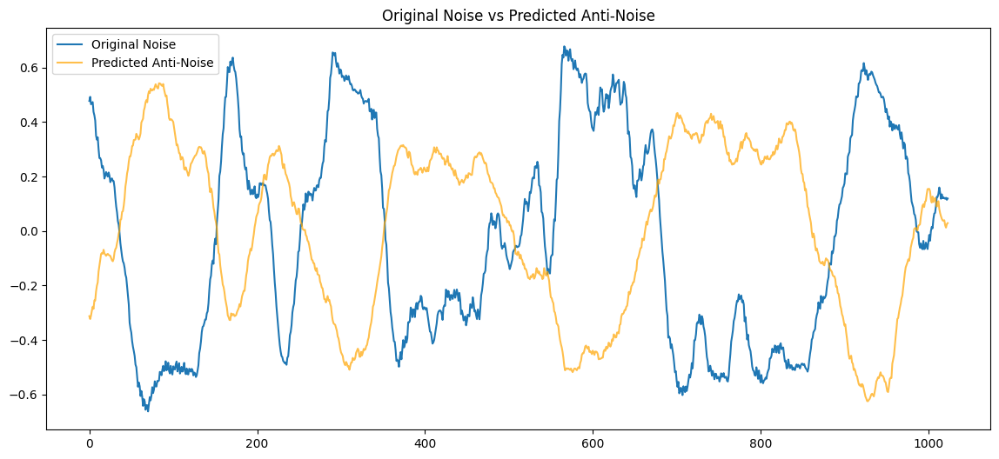

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.3019448  -0.26710266 -0.3052504  -0.26798987 -0.22619823 -0.230356
 -0.27957046 -0.365014   -0.24127358 -0.24850754]
Output waveform first 10 values: [0.25188154 0.24958748 0.2420829  0.23100777 0.2270144  0.23140459
 0.2358779  0.23548755 0.25131664 0.25021297]


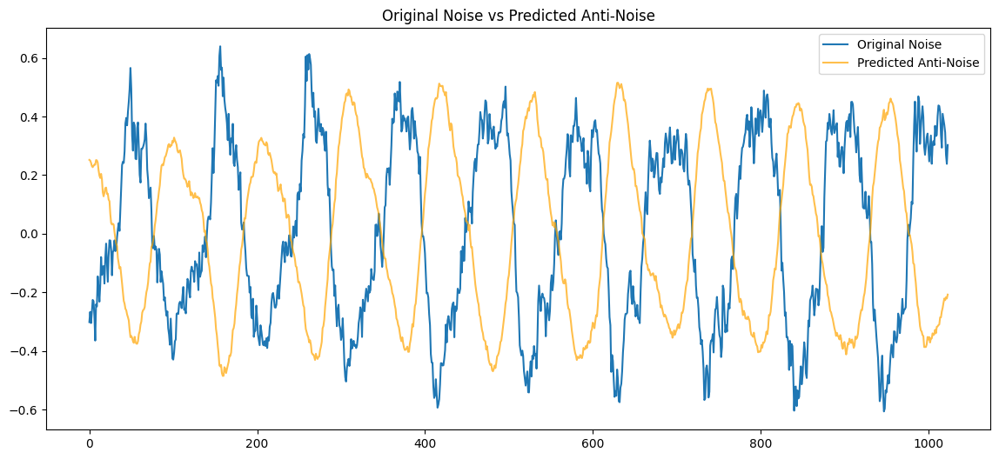

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.09263591 0.09707731 0.1028159  0.10996061 0.1164576  0.12180452
 0.12740634 0.13223848 0.1386426  0.14400858]
Output waveform first 10 values: [-0.1578438  -0.16235118 -0.17356086 -0.18411781 -0.18901813 -0.19533354
 -0.20304964 -0.21580963 -0.22017431 -0.2338296 ]


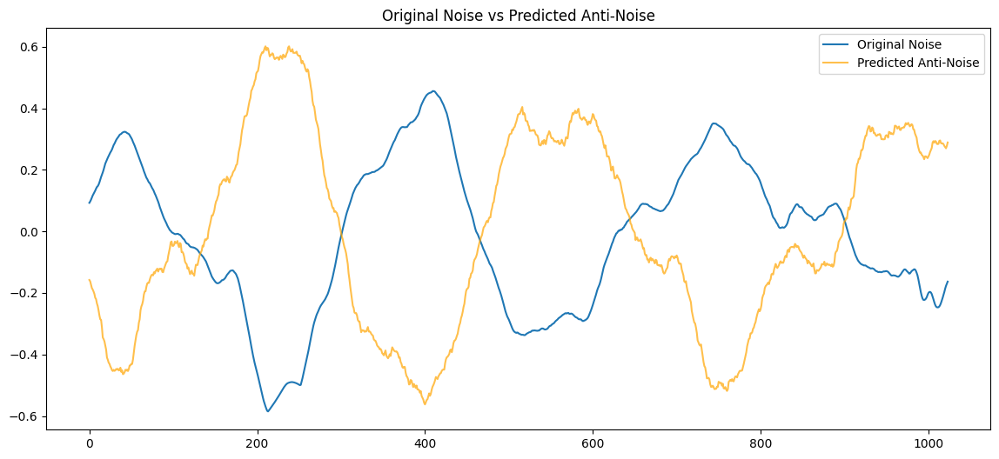

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.3202105  -0.30101573 -0.33910146 -0.3823616  -0.43606    -0.45304877
 -0.47024524 -0.4921981  -0.4547123  -0.39400208]
Output waveform first 10 values: [0.37345588 0.3747527  0.38018614 0.38622385 0.39035586 0.4038011
 0.39986026 0.41783056 0.43754384 0.4377103 ]


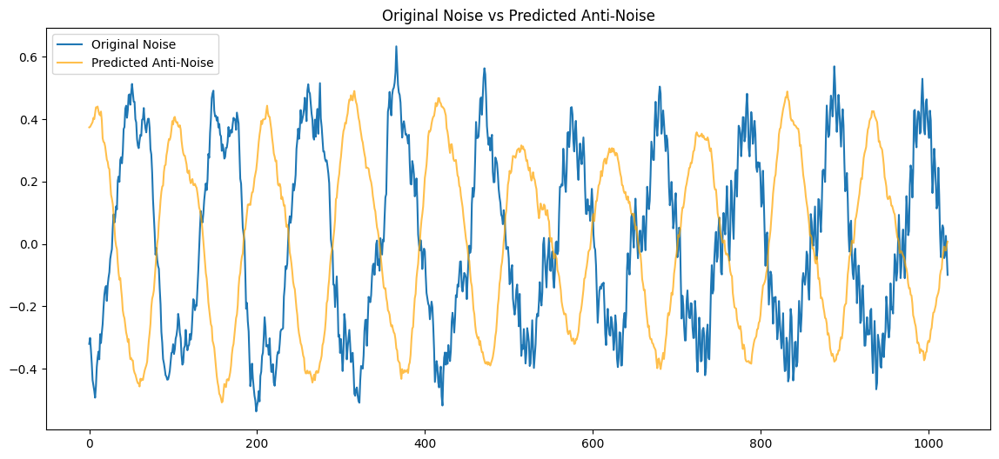

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.40275618 -0.3996782  -0.39686978 -0.39433578 -0.3923749  -0.39026445
 -0.3885259  -0.38679698 -0.38475826 -0.38224816]
Output waveform first 10 values: [0.24926963 0.2595353  0.26858088 0.27101305 0.28590038 0.291183
 0.28141716 0.29355776 0.29666442 0.29977793]


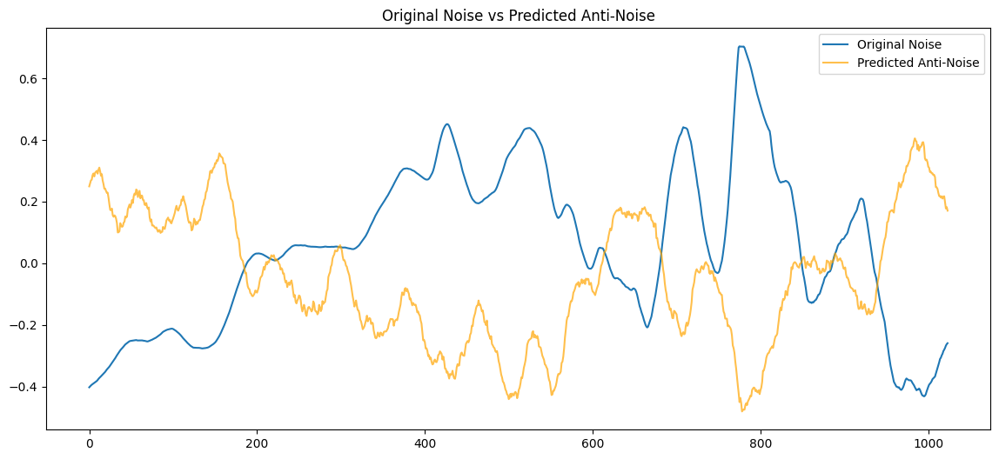

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.27633765 0.2298179  0.281934   0.18427435 0.20124362 0.23691106
 0.29483858 0.30409378 0.33220276 0.29080802]
Output waveform first 10 values: [-0.27615947 -0.26451305 -0.26838872 -0.27776188 -0.27381003 -0.28342018
 -0.29951054 -0.30465922 -0.2946794  -0.29137623]


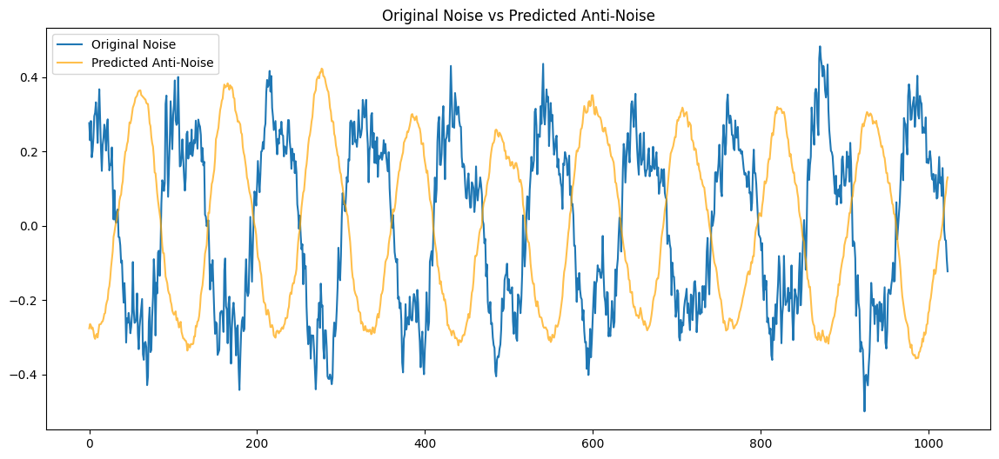

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.2216539  -0.16146076 -0.12532517 -0.06309821 -0.03020895 -0.07577884
 -0.05979744 -0.02063799  0.03768108  0.0542448 ]
Output waveform first 10 values: [ 0.17769358  0.1588229   0.11912766  0.06200632  0.05587532  0.0407607
  0.00486855 -0.03252626 -0.04728252 -0.06344285]


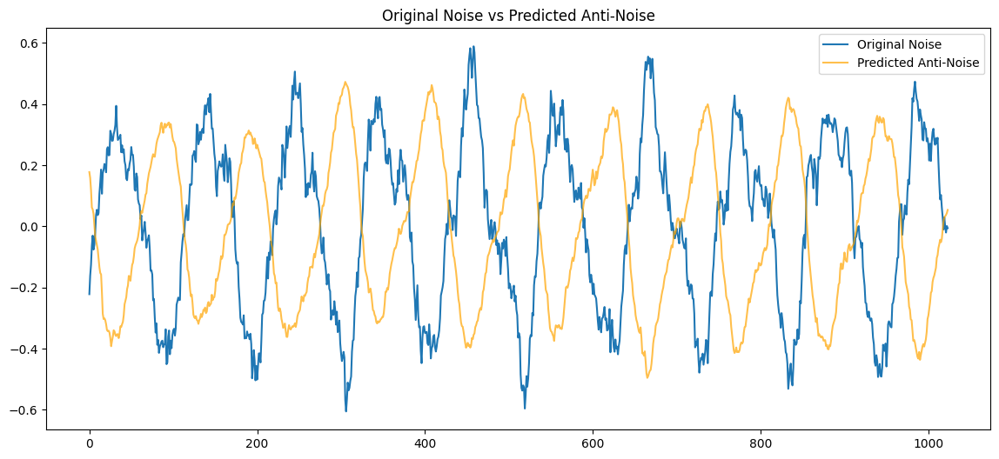

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.32545263 -0.34023312 -0.31993955 -0.29490826 -0.32482678 -0.32508522
 -0.29886243 -0.3277354  -0.3431318  -0.30275467]
Output waveform first 10 values: [0.4254413  0.41414455 0.41732016 0.43174803 0.42030156 0.4033072
 0.4125655  0.41001117 0.40759185 0.40963984]


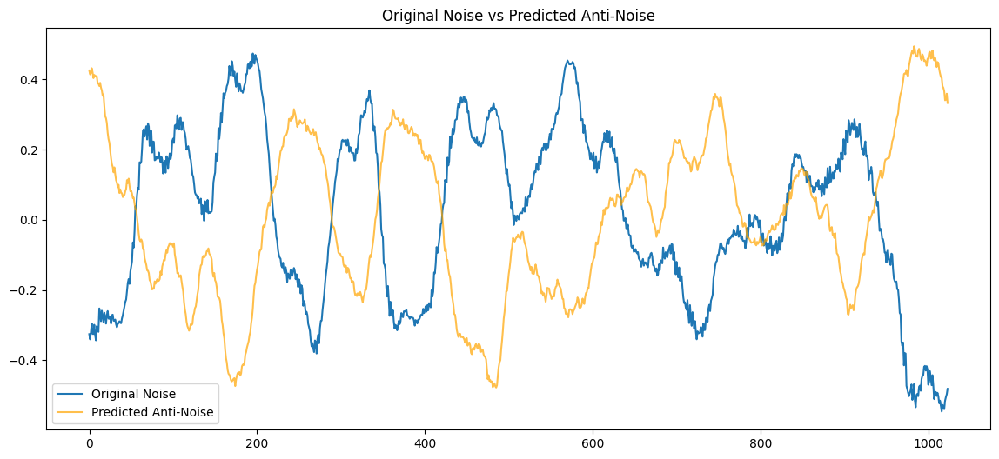

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.4251543  0.3871629  0.31298918 0.26958412 0.24033049 0.23480912
 0.25039816 0.13821505 0.05560847 0.01211772]
Output waveform first 10 values: [-0.16861257 -0.18323748 -0.20117271 -0.17721131 -0.16397244 -0.15867205
 -0.1423476  -0.12592648 -0.08641307 -0.060978  ]


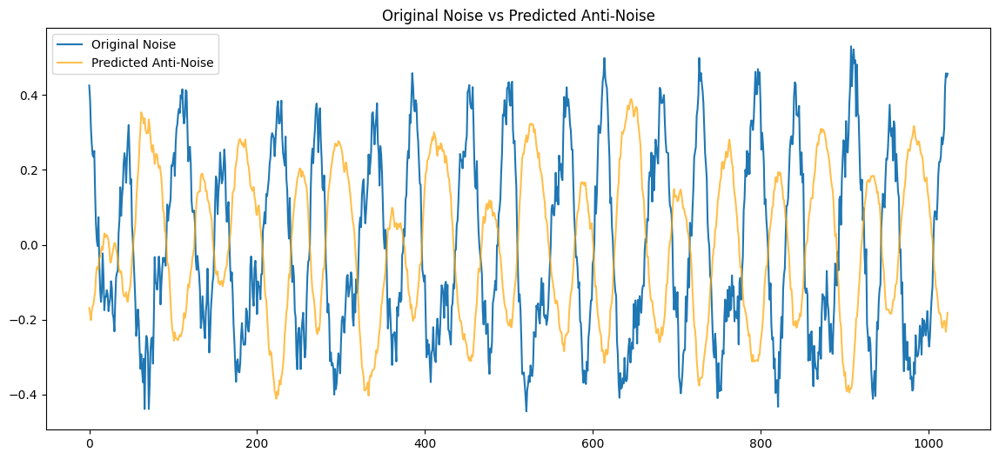

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.2559034  -0.31468102 -0.33943275 -0.37961838 -0.4270272  -0.45351034
 -0.5134211  -0.50753987 -0.5841328  -0.6075477 ]
Output waveform first 10 values: [0.46735454 0.4760655  0.4888505  0.5322498  0.5199402  0.524283
 0.568554   0.58730716 0.59677494 0.6217764 ]


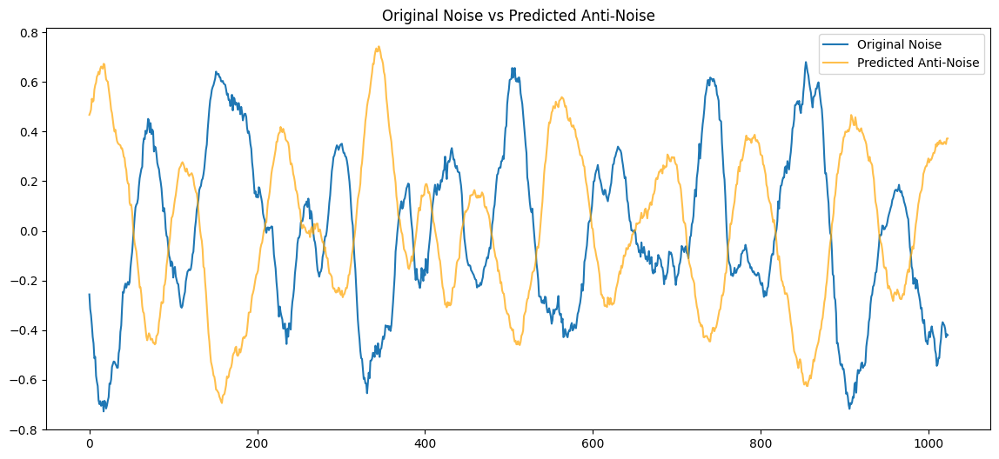

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.02405944 0.02665159 0.02914122 0.03149679 0.03408258 0.0377669
 0.04262616 0.04829504 0.05342503 0.05778983]
Output waveform first 10 values: [ 0.01219911 -0.00805153 -0.015942   -0.01819141 -0.03479984 -0.0664679
 -0.07479649 -0.10801414 -0.12253788 -0.12266473]


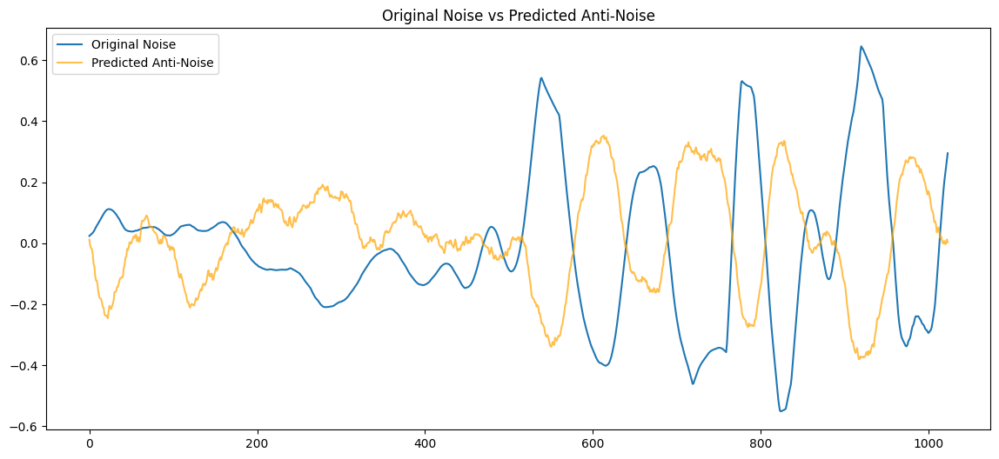

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.14227614 -0.13252534 -0.12345687 -0.11443698 -0.10458523 -0.09434782
 -0.08542006 -0.07788203 -0.07115662 -0.06475712]
Output waveform first 10 values: [0.17299172 0.16483173 0.16309884 0.16838306 0.1458227  0.1517538
 0.13986096 0.1338359  0.13894908 0.12356246]


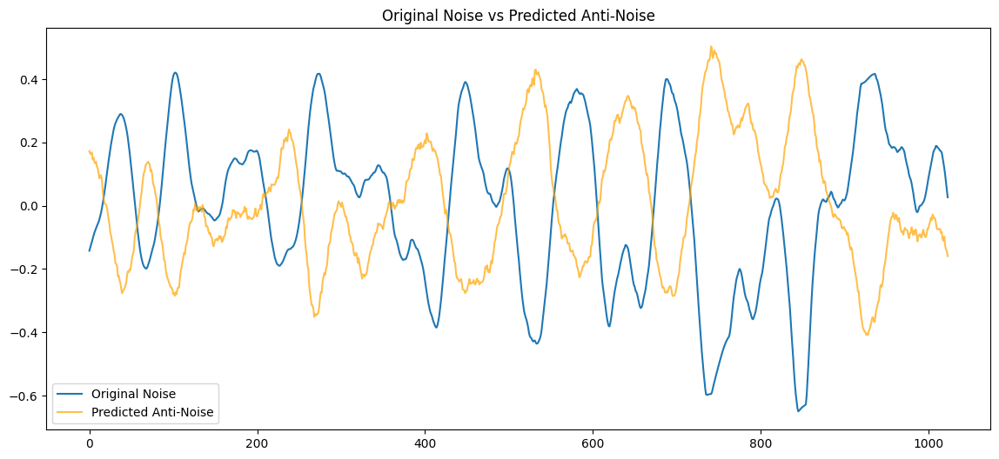

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.17715515 0.16333131 0.19166274 0.23615493 0.19604827 0.20991524
 0.18999596 0.18356262 0.16911963 0.19041128]
Output waveform first 10 values: [-0.15955159 -0.16452782 -0.16525234 -0.15512621 -0.17142794 -0.18110482
 -0.18526629 -0.1986948  -0.19338334 -0.19247665]


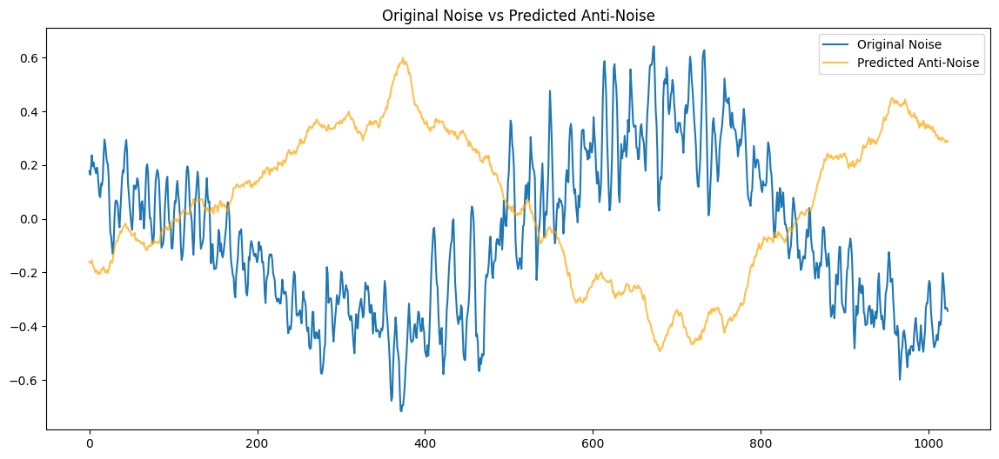

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.07560978 -0.08812682 -0.09211434 -0.07840611 -0.06871966 -0.07052192
 -0.08793495 -0.10769526 -0.11239155 -0.10967664]
Output waveform first 10 values: [0.03035241 0.02930128 0.02834402 0.03917524 0.02525372 0.01739516
 0.04165941 0.03998988 0.04590394 0.04573377]


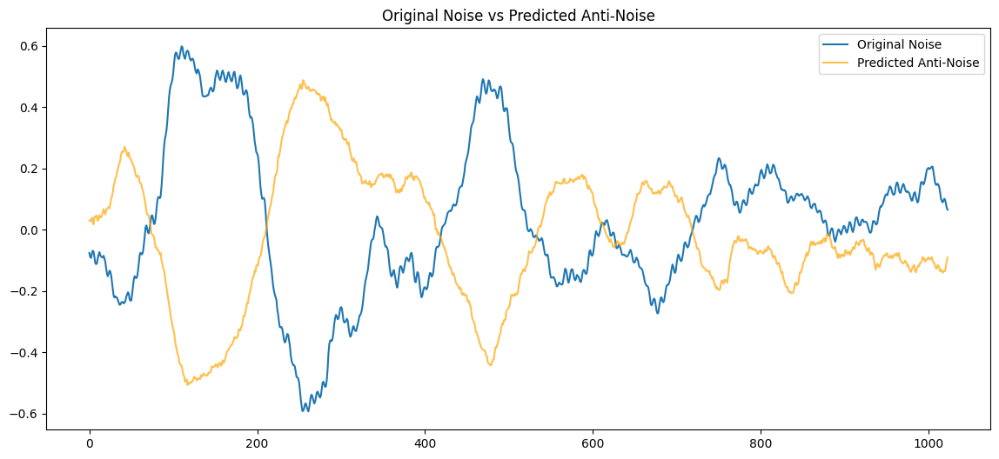

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.40349957 0.40254697 0.390204   0.3695695  0.34703785 0.31703502
 0.2776936  0.23435251 0.18756728 0.13386002]
Output waveform first 10 values: [-0.12843496 -0.12482189 -0.11276308 -0.10441843 -0.0841696  -0.07019262
 -0.08181733 -0.08053838 -0.04593005 -0.02490826]


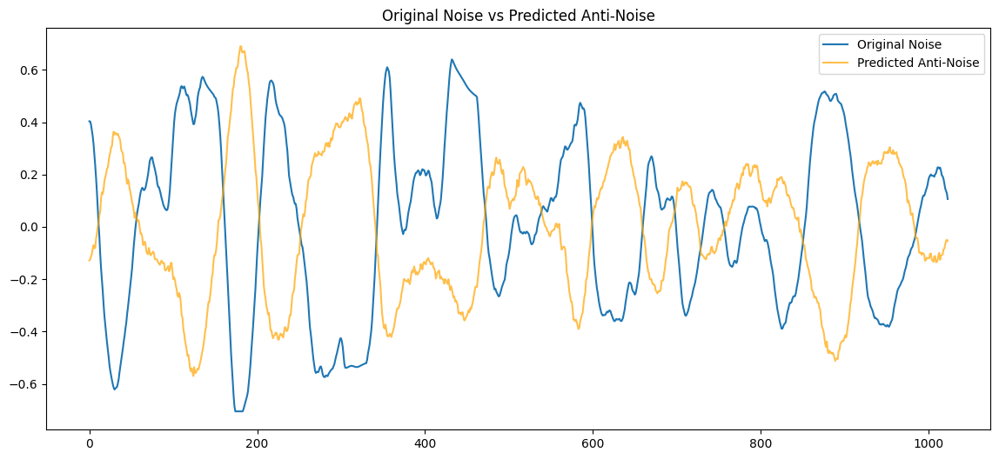

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.12829836 -0.10507787 -0.1332174  -0.15369236 -0.14534394 -0.09892576
 -0.0634901  -0.06338438 -0.05758046 -0.06879295]
Output waveform first 10 values: [-0.00599741 -0.02155267 -0.02045091 -0.01850777 -0.04241616 -0.06012597
 -0.06801675 -0.09464098 -0.07799079 -0.08270851]


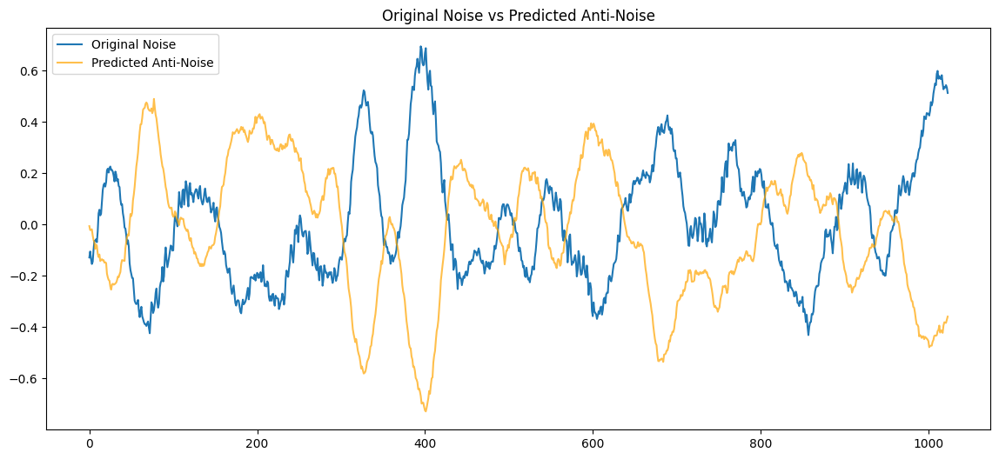

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.05665988 -0.09411706 -0.11119084 -0.0685551  -0.04703192 -0.08037346
 -0.05333628 -0.01173178 -0.0134513   0.01915645]
Output waveform first 10 values: [ 0.09389586  0.06220073  0.04855926  0.0087341  -0.02095383 -0.06040668
 -0.05219191 -0.07615683 -0.07857898 -0.08740561]


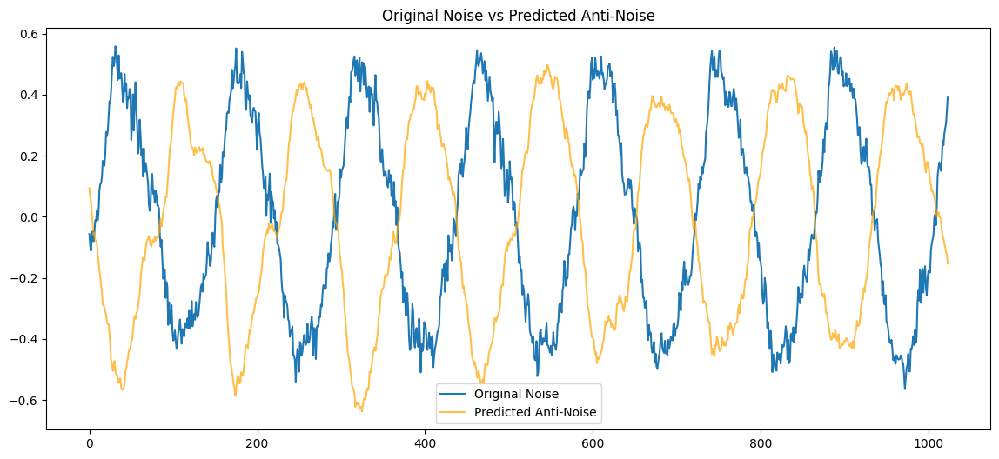

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.16612135 -0.20652002 -0.22064352 -0.22275761 -0.22410262 -0.24652772
 -0.2549582  -0.2397069  -0.24113397 -0.23934546]
Output waveform first 10 values: [0.14631629 0.1218591  0.12266415 0.12987708 0.11099964 0.12349868
 0.10691309 0.09721776 0.09651639 0.10047607]


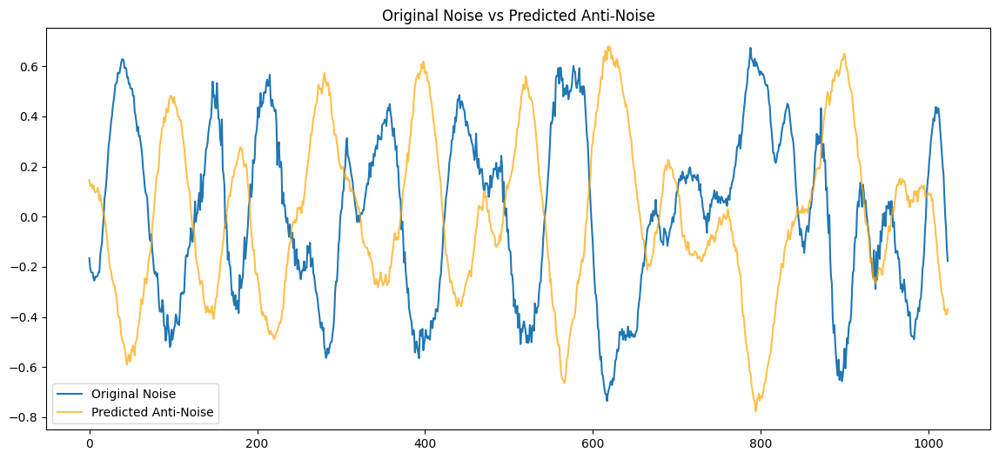

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.23563403 -0.27837437 -0.30175975 -0.3321658  -0.34945866 -0.35778627
 -0.35544646 -0.37116265 -0.39750606 -0.41501456]
Output waveform first 10 values: [0.25698906 0.25864005 0.2636996  0.2709209  0.26872975 0.27167064
 0.27617314 0.2712347  0.28562188 0.29643714]


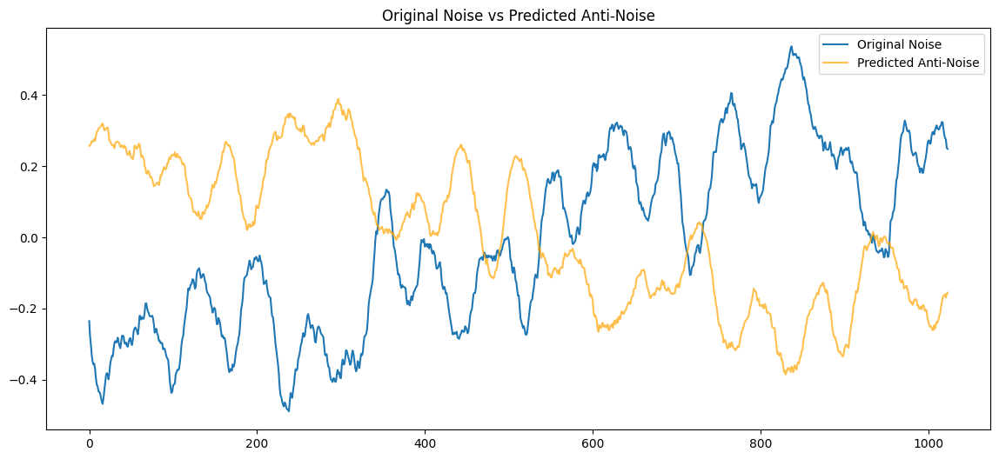

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.03589915 0.0363503  0.04392114 0.03954448 0.04585917 0.05161325
 0.04937287 0.05326126 0.05346641 0.05102984]
Output waveform first 10 values: [ 0.09543031  0.08729041  0.02708175  0.01431059  0.00588701 -0.04690029
 -0.04021188 -0.08043179 -0.08982347 -0.09929751]


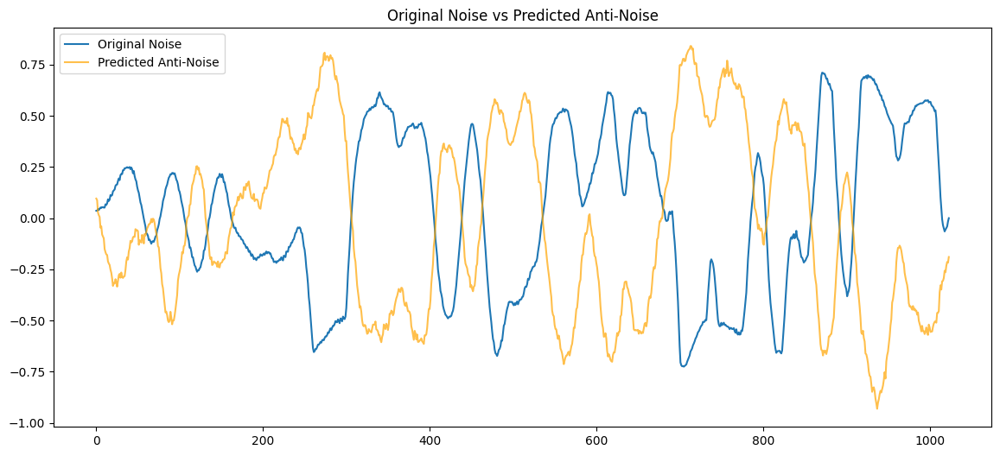

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.08797127 -0.08582417 -0.191897   -0.23380296 -0.2003247  -0.21788937
 -0.23765029 -0.19925335 -0.15301776 -0.15391944]
Output waveform first 10 values: [ 0.03745769  0.02439434  0.02293561  0.02805742  0.01395368  0.01976166
  0.01902241  0.0112963   0.00179759 -0.0079294 ]


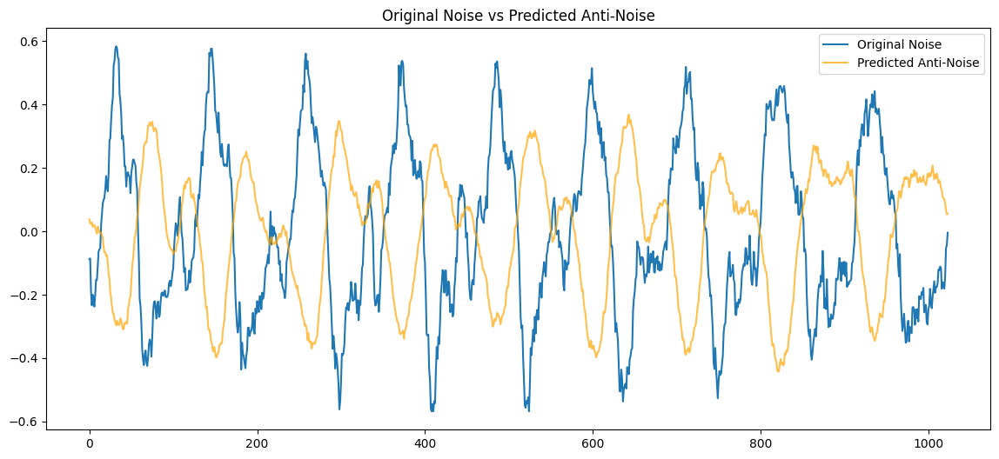

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.04819727 -0.05599087 -0.06183808 -0.06864696 -0.07657693 -0.0862216
 -0.09472895 -0.10215725 -0.11407169 -0.13124768]
Output waveform first 10 values: [0.21306059 0.21433707 0.21098422 0.21661724 0.21133806 0.20339227
 0.19861414 0.1908721  0.1940422  0.19675462]


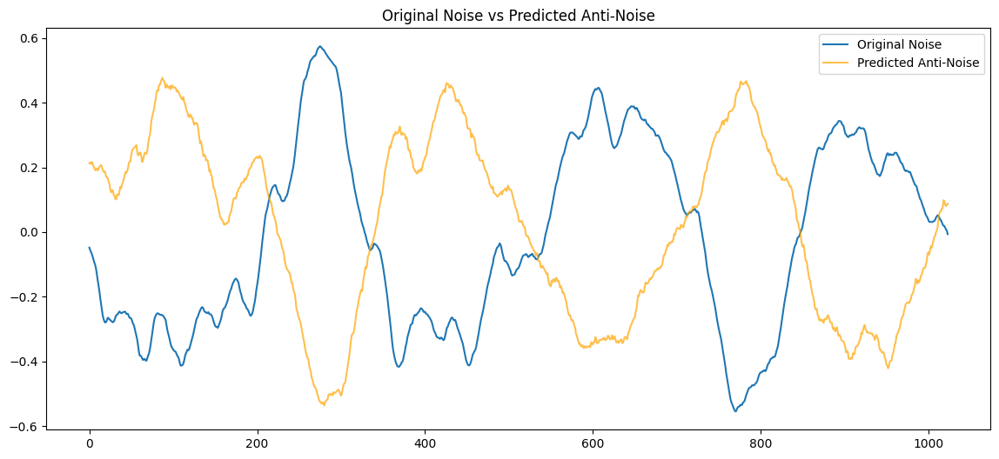

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.24115472 -0.26062208 -0.24546313 -0.22972858 -0.2510212  -0.25126877
 -0.23824565 -0.24795444 -0.24663001 -0.25029147]
Output waveform first 10 values: [0.18952909 0.20357695 0.21467909 0.2364532  0.21991432 0.231825
 0.2370584  0.2413974  0.25257587 0.25640684]


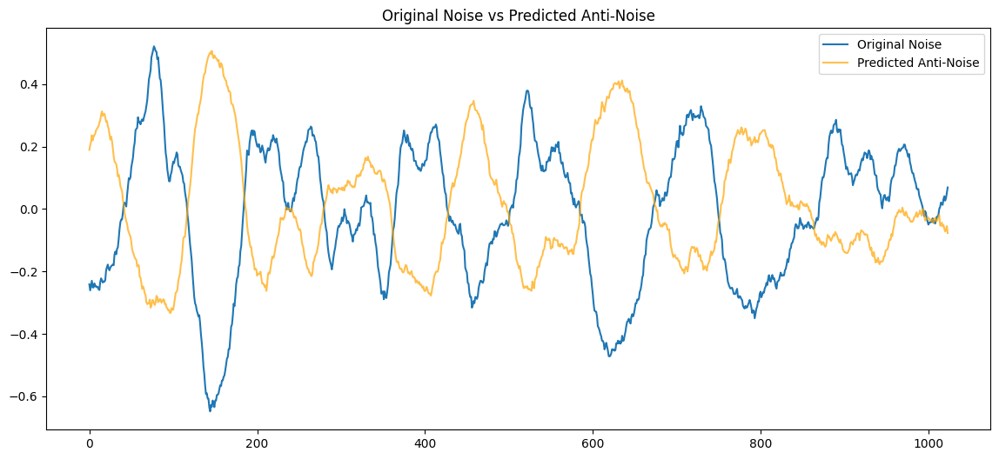

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.43614203 0.41428235 0.46456793 0.4481936  0.4797506  0.5225197
 0.52679    0.50429946 0.47678676 0.4904074 ]
Output waveform first 10 values: [-0.39080453 -0.39845252 -0.39263776 -0.3901456  -0.38630053 -0.4011002
 -0.40597087 -0.418423   -0.42279103 -0.41848207]


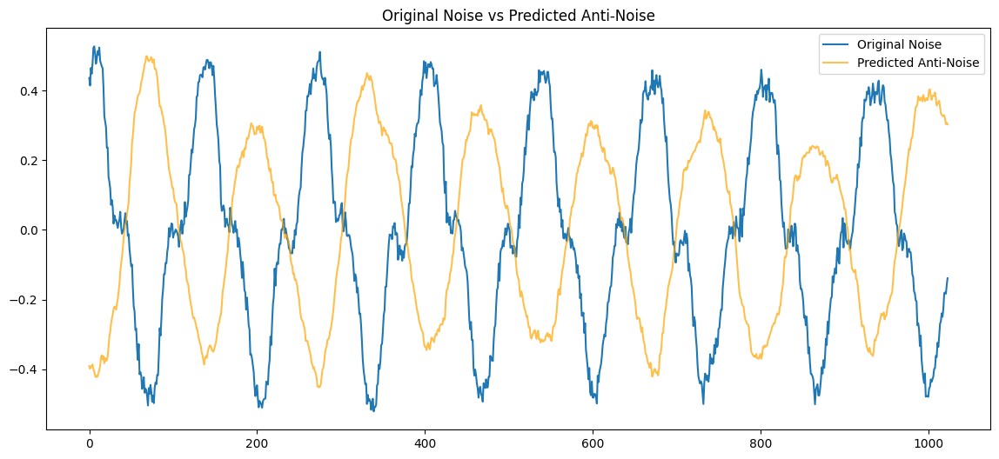

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.33233544 0.33035553 0.3262182  0.31904754 0.3067806  0.29193965
 0.27679488 0.26356617 0.25437936 0.24562761]
Output waveform first 10 values: [-0.09092492 -0.10358484 -0.14059104 -0.15389188 -0.16222928 -0.17724031
 -0.1757814  -0.18983114 -0.16140573 -0.13608788]


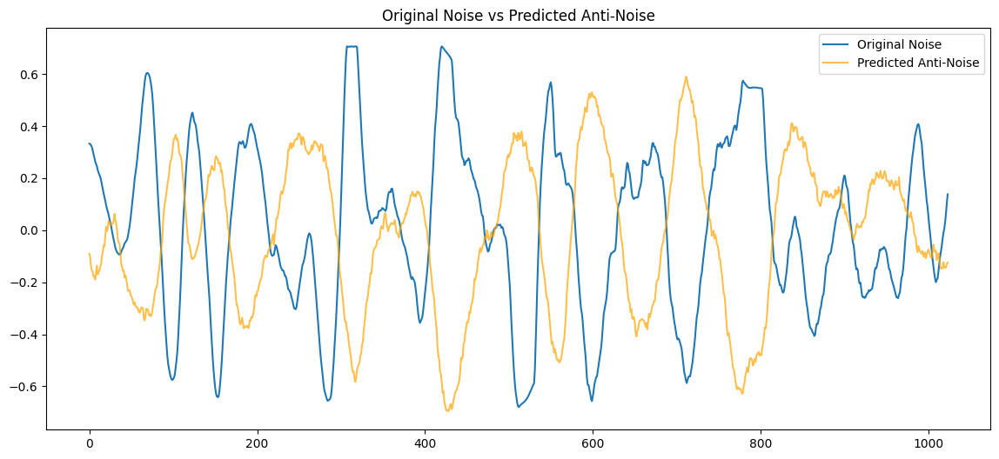

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.01561948 0.01741709 0.00888794 0.00572786 0.05624472 0.0598126
 0.09957902 0.10456337 0.08616566 0.07358951]
Output waveform first 10 values: [0.0182206  0.00862274 0.01812028 0.04158083 0.0139226  0.00491363
 0.03771386 0.00987253 0.01285373 0.03530088]


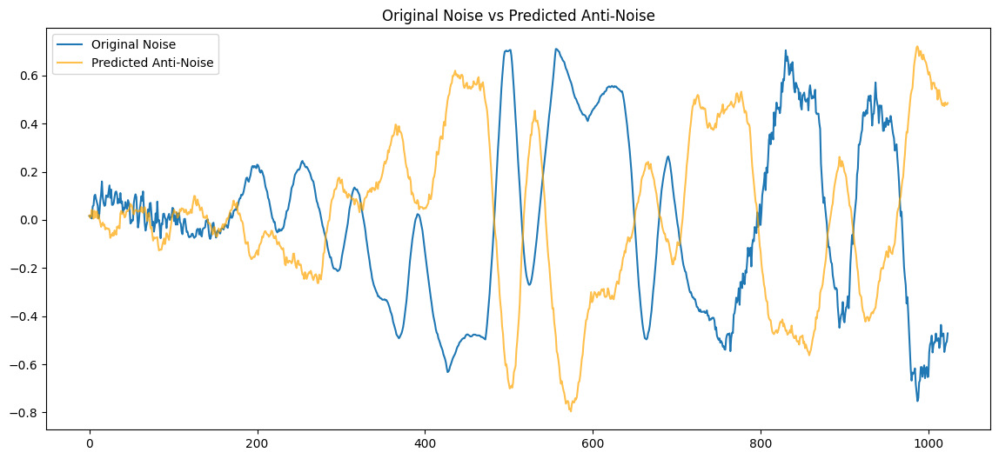

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.20531926 -0.14512439 -0.12329173 -0.13747323 -0.13816005 -0.15898414
 -0.17070602 -0.15723403 -0.15204926 -0.15628162]
Output waveform first 10 values: [0.07050455 0.06925783 0.07370488 0.07692072 0.08389436 0.08265238
 0.07825813 0.07278775 0.07237204 0.07231666]


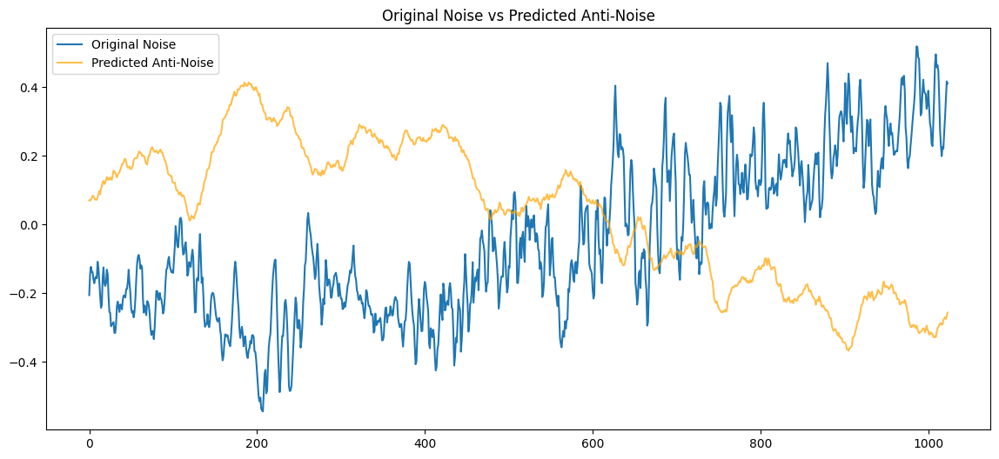

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [ 0.02427263  0.02988057  0.00150152 -0.06013434 -0.06959588 -0.02978672
  0.06437027  0.03515049  0.04830276  0.13582322]
Output waveform first 10 values: [ 0.03135584  0.03007891  0.03404082  0.02660718  0.00849696 -0.01238068
 -0.01748377 -0.04971952 -0.05948969 -0.05570609]


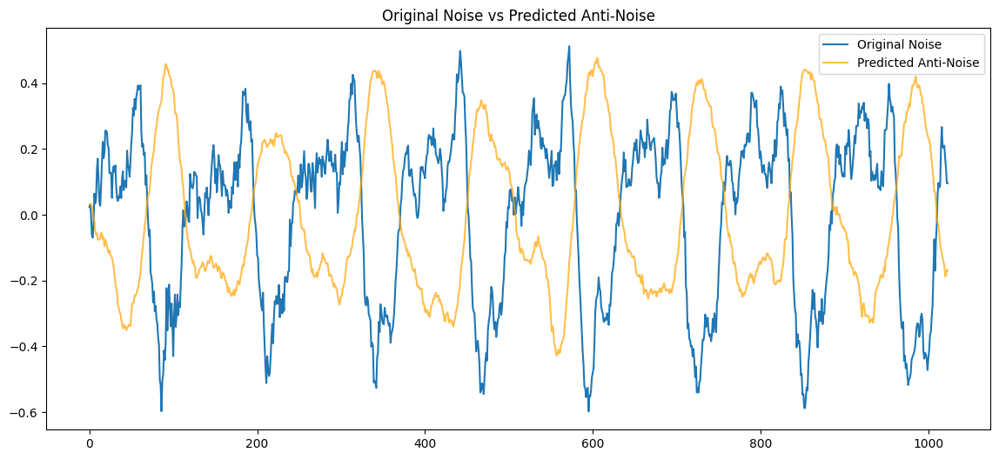

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.26099685 -0.3100549  -0.25300524 -0.28889057 -0.24202545 -0.29688156
 -0.30306554 -0.30317616 -0.29466695 -0.2781018 ]
Output waveform first 10 values: [0.1300922  0.13445766 0.13321452 0.15140055 0.16552058 0.16156574
 0.15928037 0.15683268 0.16687256 0.18599355]


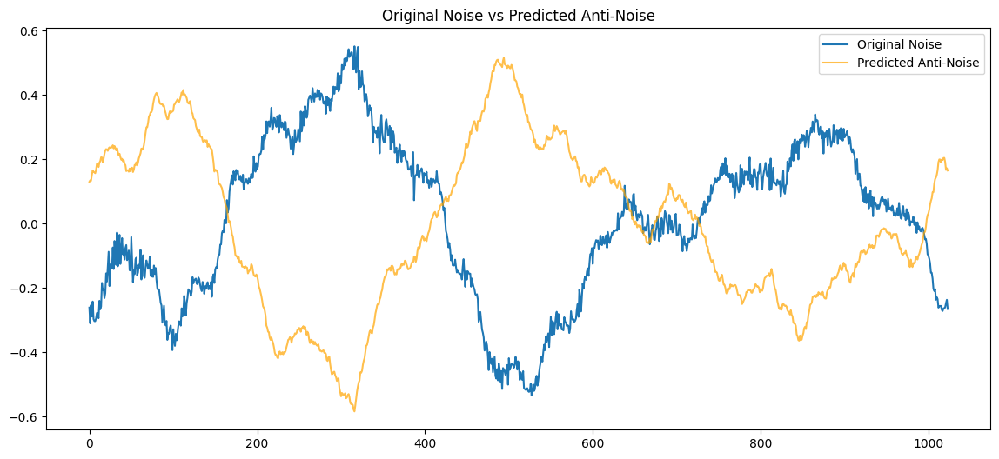

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.16191852 -0.12436536 -0.09743676 -0.0712816  -0.05602706 -0.05386944
 -0.05868992 -0.05582074 -0.05743827 -0.07045233]
Output waveform first 10 values: [0.3226843  0.30686137 0.30356693 0.3155041  0.31563133 0.30813485
 0.31131557 0.3058301  0.30730075 0.31091374]


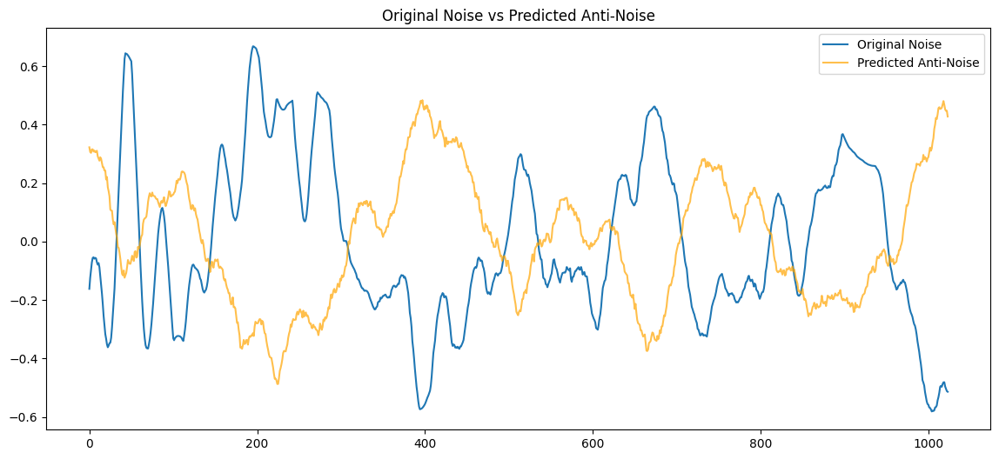

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.4164449  -0.38973925 -0.37891915 -0.36265025 -0.35251418 -0.34290832
 -0.32061744 -0.31710607 -0.2988732  -0.29794458]
Output waveform first 10 values: [0.26112616 0.2512341  0.23188196 0.24175467 0.23319958 0.2233139
 0.22577693 0.201841   0.19289689 0.188358  ]


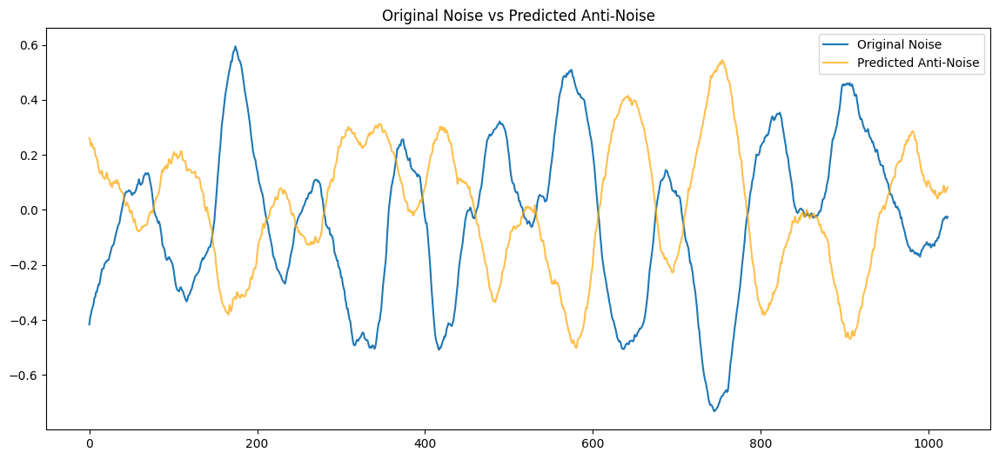

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.2311664  -0.22422625 -0.21783882 -0.19946891 -0.19228807 -0.19313309
 -0.20228533 -0.18667018 -0.16570477 -0.17419091]
Output waveform first 10 values: [0.23103893 0.23519602 0.23685387 0.24978162 0.26616836 0.26876655
 0.2796224  0.2832084  0.2883736  0.30206937]


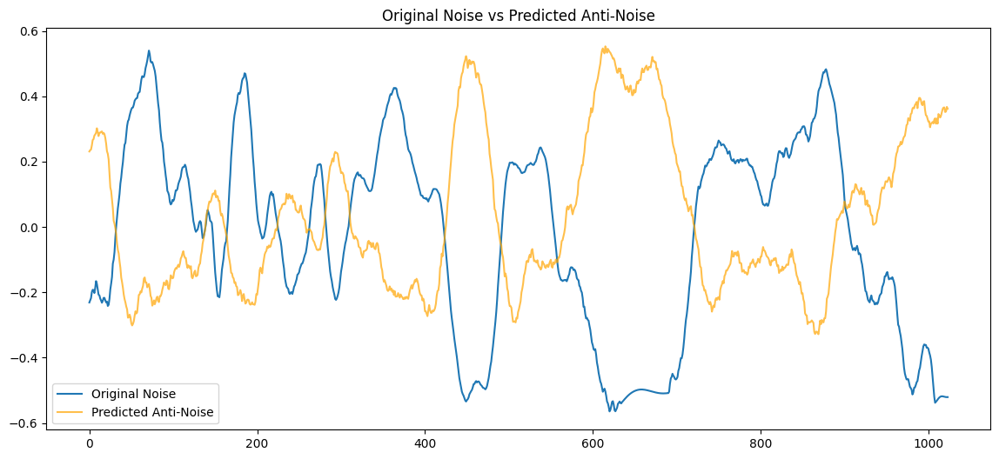

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.13054247 -0.18218987 -0.21376598 -0.2437471  -0.26838666 -0.2811805
 -0.2898365  -0.3152977  -0.34245414 -0.3566745 ]
Output waveform first 10 values: [0.33091572 0.33283132 0.3514221  0.37420315 0.36151972 0.367784
 0.376723   0.37987718 0.38789558 0.3891601 ]


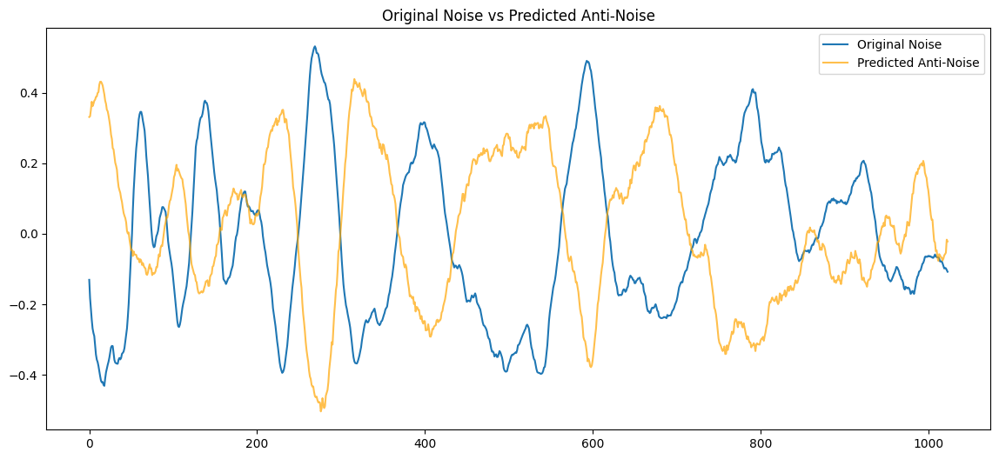

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.17593426 -0.17612556 -0.15562563 -0.13533193 -0.13327846 -0.14588803
 -0.12861556 -0.10056511 -0.10313521 -0.11223398]
Output waveform first 10 values: [0.06232741 0.05861607 0.06274287 0.06893219 0.05253699 0.04646655
 0.04483923 0.02840617 0.03219238 0.02880446]


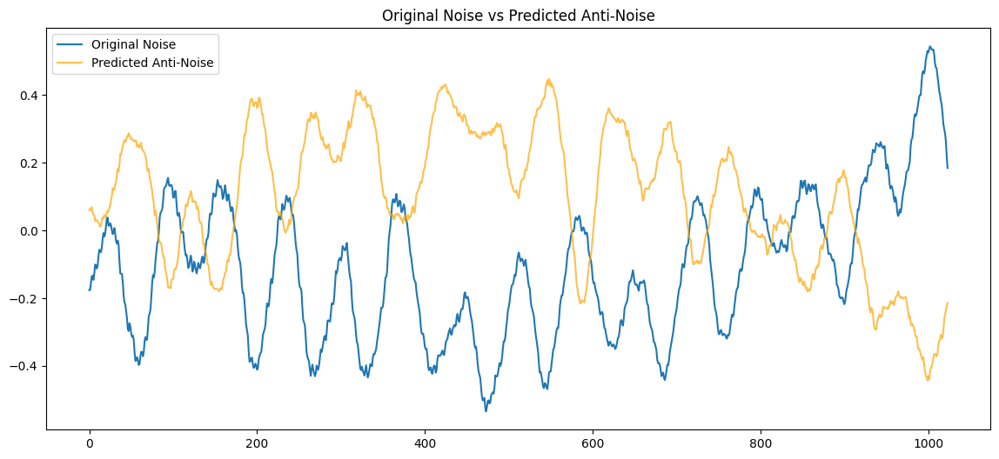

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.35249877 0.22864467 0.24782266 0.30337286 0.19098118 0.07864963
 0.0425824  0.0549457  0.08000734 0.06361646]
Output waveform first 10 values: [-0.14336023 -0.14660162 -0.12601115 -0.09255767 -0.07957049 -0.06758038
 -0.02797306 -0.01601868 -0.00426181  0.02173797]


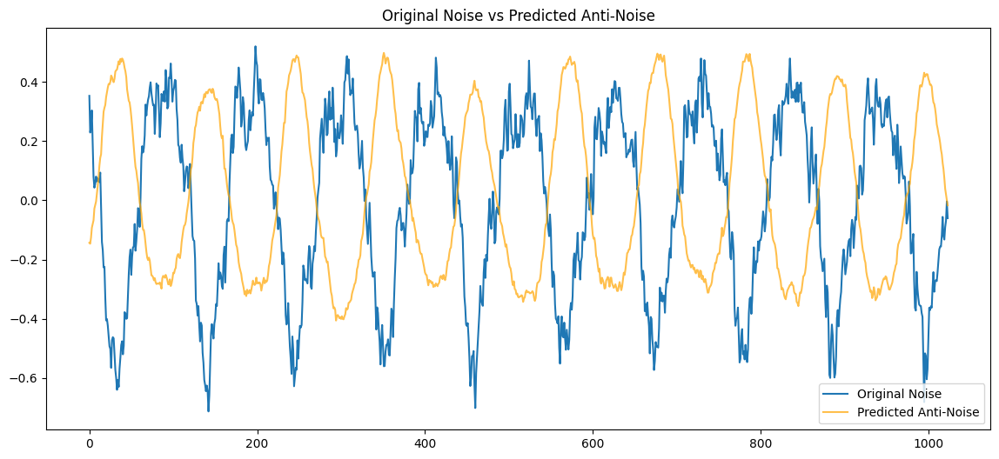

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.5248712  0.5366621  0.4694028  0.42895153 0.40169188 0.35562298
 0.2655552  0.2134056  0.17100276 0.10146884]
Output waveform first 10 values: [-0.18969393 -0.20512629 -0.20762487 -0.20195688 -0.18879911 -0.18247871
 -0.16524902 -0.14033686 -0.09523106 -0.08745844]


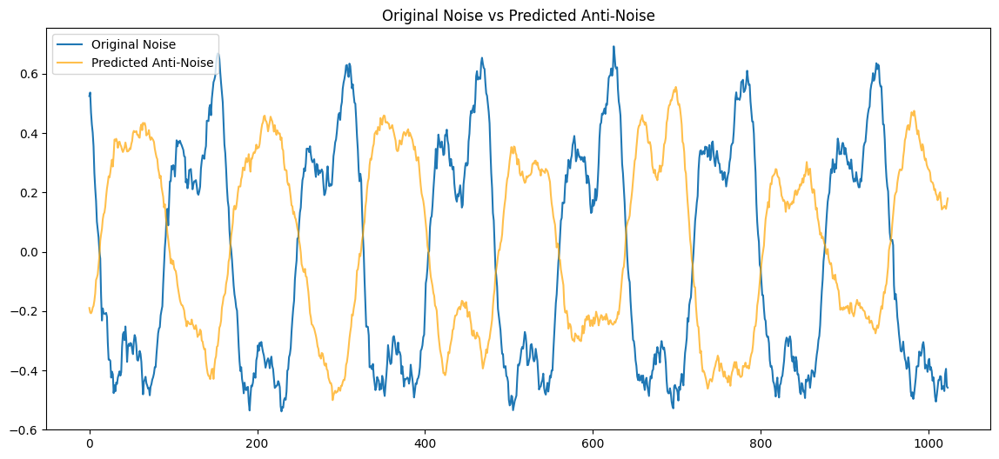

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.04724839 0.06453661 0.08660311 0.08622134 0.0834119  0.05077462
 0.06257723 0.08846542 0.09002836 0.04585029]
Output waveform first 10 values: [ 0.10111949  0.07416557  0.05491597  0.05449073  0.02909372  0.03432668
  0.02779239 -0.00633706 -0.00938961  0.01200031]


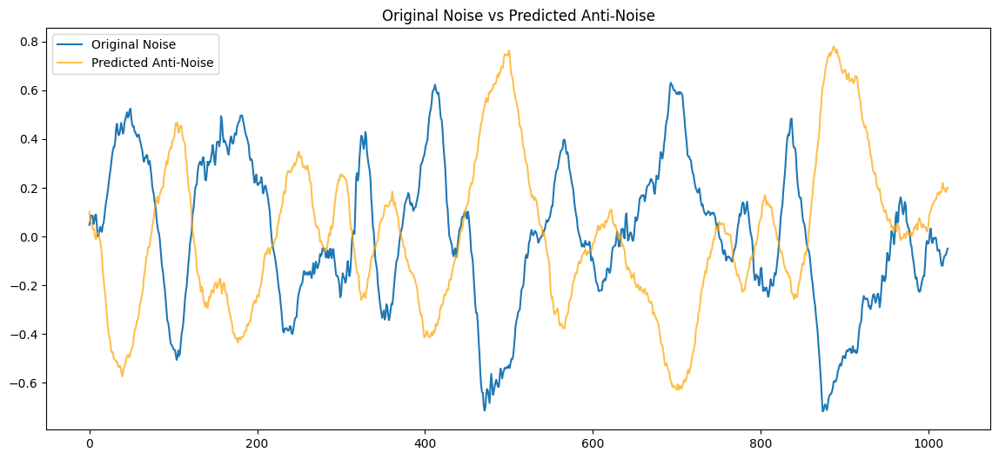

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [ 0.00731033 -0.00681445 -0.07501366 -0.06855197 -0.11299174 -0.08907469
 -0.11555365 -0.18099914 -0.1944003  -0.2368114 ]
Output waveform first 10 values: [-0.1352413  -0.10330977 -0.06889693 -0.01641132  0.00140008  0.04832624
  0.10432409  0.14981402  0.18763368  0.2242007 ]


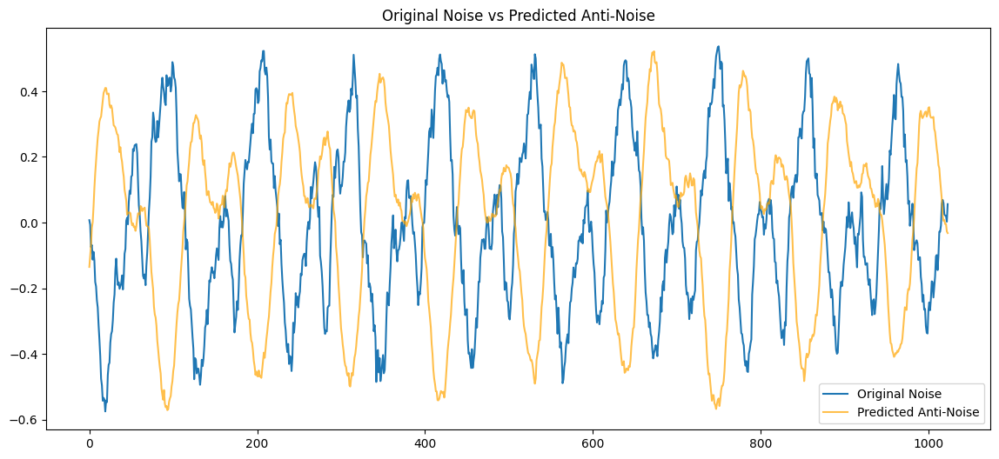

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.08612998 -0.0950181  -0.14816931 -0.12356056 -0.31131327 -0.20856819
 -0.28649852 -0.32416725 -0.31736016 -0.3832518 ]
Output waveform first 10 values: [0.26741174 0.2617951  0.24924058 0.27796128 0.27643734 0.2989092
 0.29809856 0.31155783 0.32300735 0.33508104]


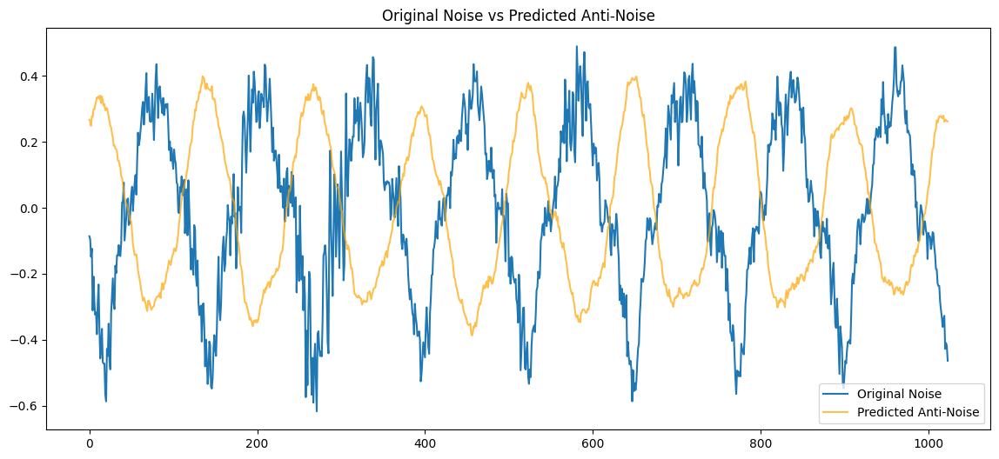

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.05599556  0.00487112 -0.02103353 -0.07532334 -0.07640489 -0.03616519
 -0.10057007 -0.12673955 -0.15109193 -0.1557852 ]
Output waveform first 10 values: [-0.11570161 -0.09575311 -0.09061611 -0.07658085 -0.07906282 -0.08713765
 -0.09050184 -0.06554759 -0.07784362 -0.06855663]


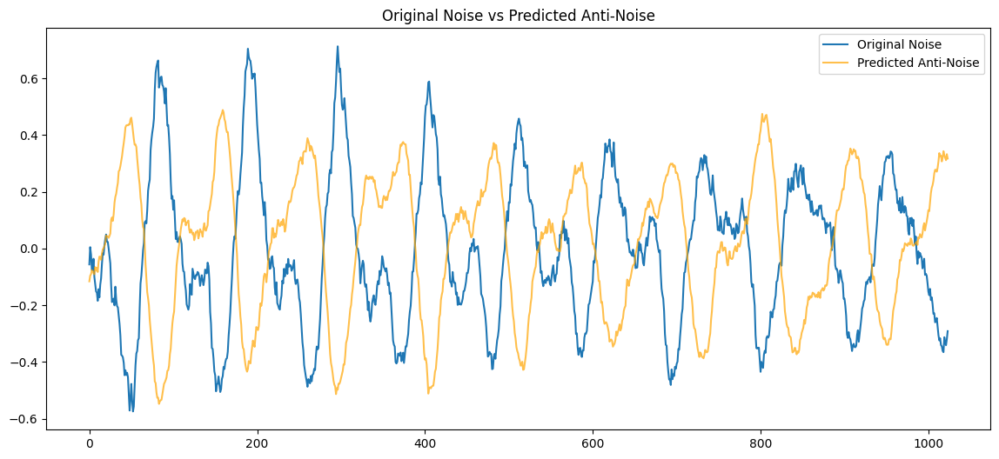

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.4604944  0.48426804 0.48721555 0.5002684  0.5125872  0.50490457
 0.5214262  0.51789653 0.511956   0.49536812]
Output waveform first 10 values: [-0.33639202 -0.3567535  -0.33805802 -0.3343026  -0.35694396 -0.36151594
 -0.33397725 -0.31392077 -0.2873652  -0.2851966 ]


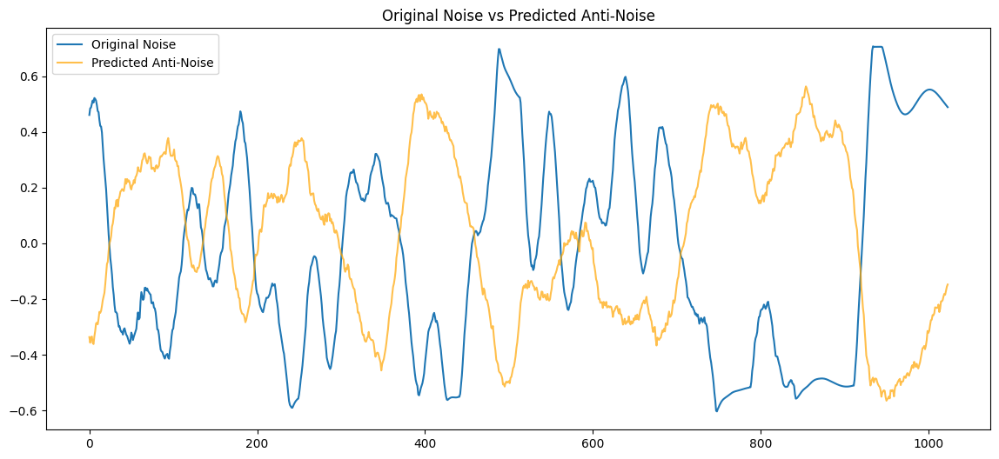

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.48678342 0.4828808  0.46826658 0.4351195  0.40032718 0.37250906
 0.3552286  0.32867792 0.31256026 0.29605022]
Output waveform first 10 values: [-0.23612767 -0.2548515  -0.26705164 -0.25184664 -0.25341275 -0.2704511
 -0.27505288 -0.29115093 -0.28546163 -0.2806672 ]


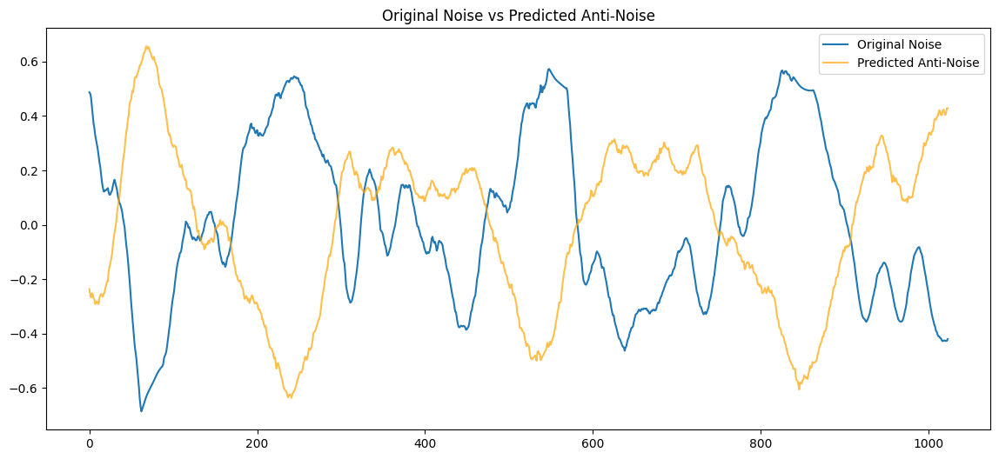

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.1969071  -0.20756418 -0.20248345 -0.2008346  -0.26477045 -0.22242312
 -0.22719577 -0.17263572 -0.26440114 -0.37683234]
Output waveform first 10 values: [0.1042791  0.11520167 0.12749426 0.1500057  0.1511436  0.1582684
 0.19167243 0.2109264  0.2111571  0.229529  ]


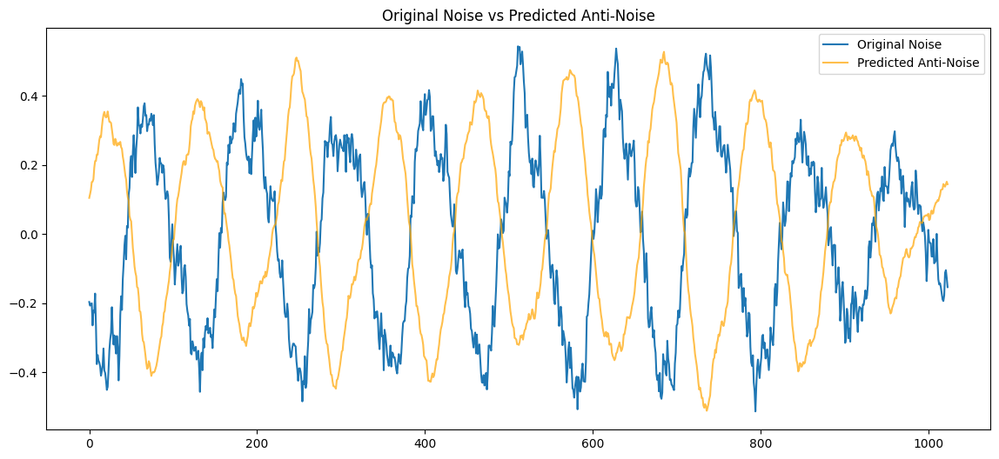

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.13217072 0.22253932 0.33225682 0.43257546 0.5177506  0.59062445
 0.6826357  0.7086518  0.7014182  0.70680445]
Output waveform first 10 values: [-0.29956657 -0.30581445 -0.3423029  -0.3703972  -0.39444682 -0.43146887
 -0.4506914  -0.47763914 -0.48986176 -0.52354157]


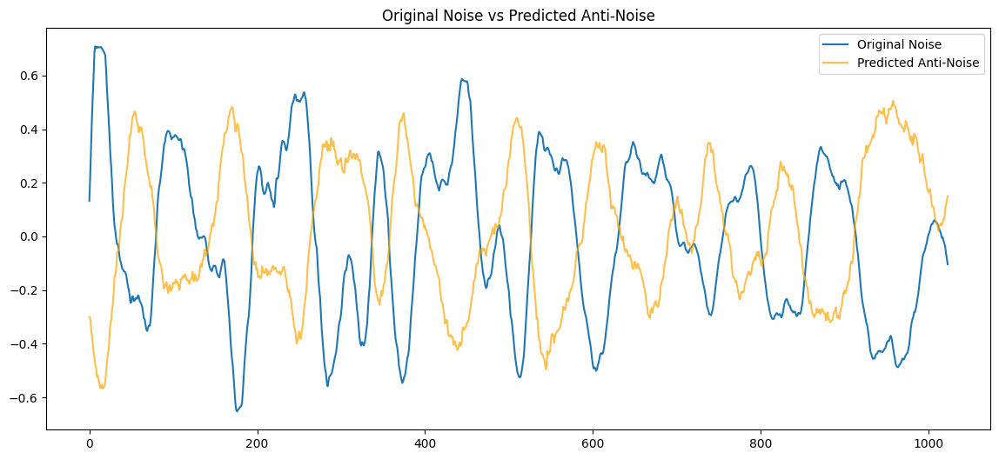

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.09468433 -0.0959297  -0.09598205 -0.09620463 -0.09848818 -0.10108382
 -0.10318013 -0.10474302 -0.10616235 -0.10770304]
Output waveform first 10 values: [-0.00788555  0.00793383  0.01227885  0.01032606  0.02483302  0.0192091
  0.03426853  0.03456986  0.0519495   0.05975393]


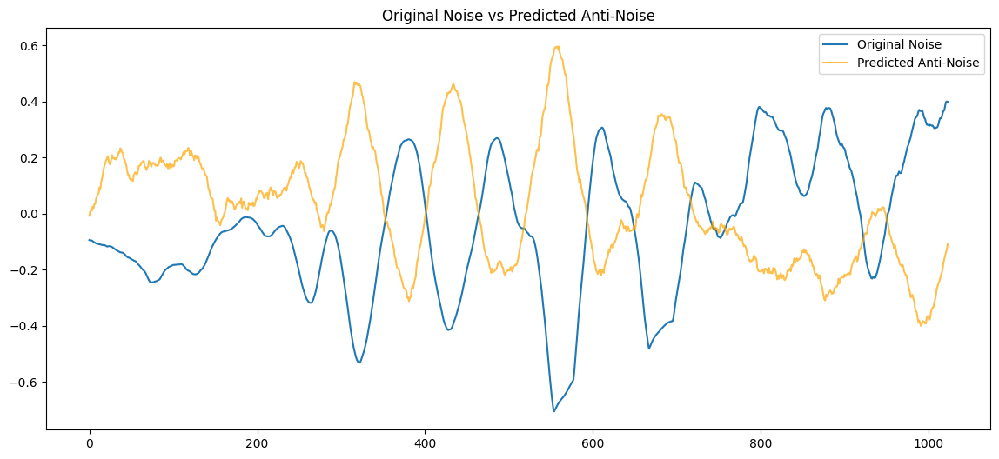

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.078855   -0.04616284 -0.00472281 -0.02974893 -0.03494612 -0.05202587
 -0.06969662 -0.04015604 -0.04464789 -0.00127291]
Output waveform first 10 values: [1.5109444e-01 1.4205745e-01 1.3510036e-01 1.2380695e-01 1.0613824e-01
 7.8780420e-02 6.0719520e-02 2.9006507e-02 5.2021760e-03 4.7644600e-05]


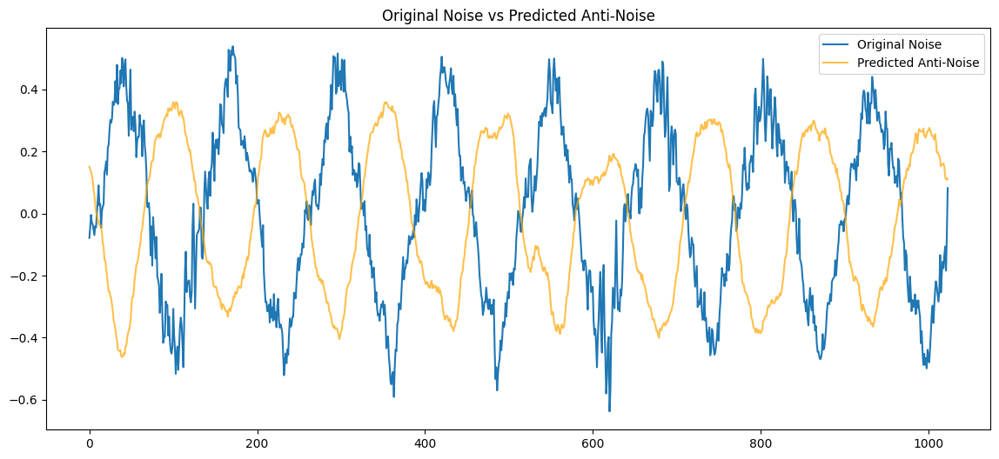

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.5412134  -0.5488652  -0.55094385 -0.560935   -0.5410733  -0.57242125
 -0.5499544  -0.54254067 -0.55724335 -0.5717864 ]
Output waveform first 10 values: [0.35505268 0.3383855  0.32500994 0.34117153 0.33279347 0.33407056
 0.3475356  0.35224837 0.3620029  0.3595128 ]


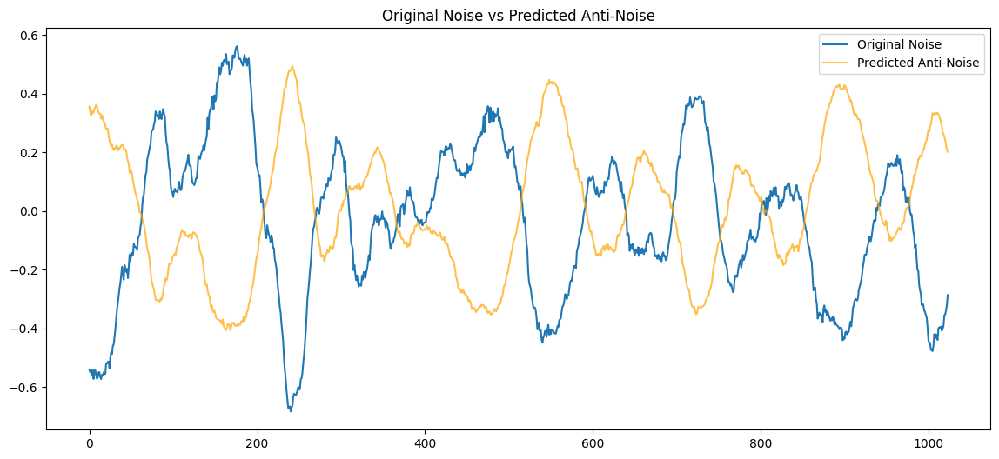

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.18752822 -0.18022743 -0.15475982 -0.14683856 -0.1547757  -0.15857331
 -0.15375982 -0.14367193 -0.13632229 -0.14661978]
Output waveform first 10 values: [0.19946235 0.19206998 0.19516057 0.19302075 0.18500252 0.19127816
 0.17958775 0.1661327  0.17998825 0.1791558 ]


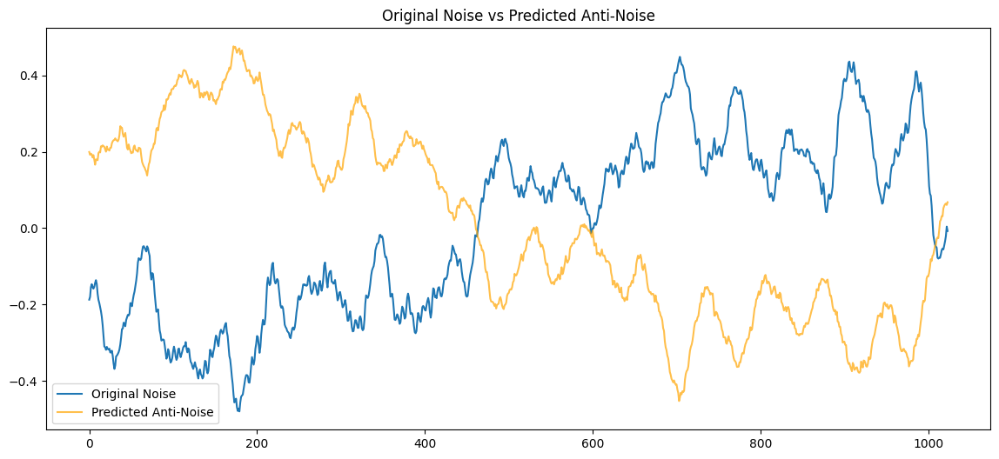

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [ 0.01142025 -0.02849793  0.02200844 -0.03875016 -0.04645972 -0.07265871
 -0.09200405 -0.09348164 -0.14312391 -0.14457376]
Output waveform first 10 values: [0.01195774 0.0397799  0.06677933 0.07677395 0.07617129 0.07992832
 0.08269967 0.07956418 0.09878199 0.11773866]


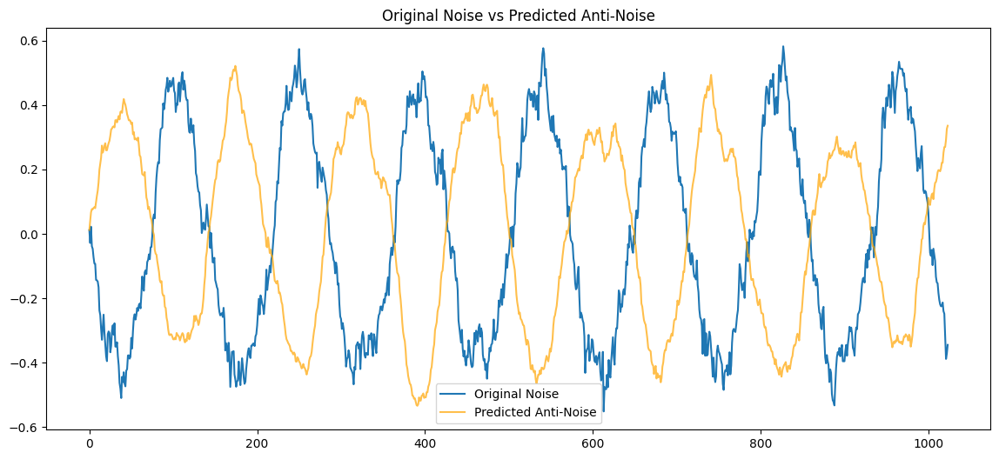

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.12486378 0.11453187 0.10287926 0.0925903  0.08272016 0.07260466
 0.06351027 0.05634109 0.04698585 0.03793874]
Output waveform first 10 values: [-0.1715056  -0.18254587 -0.18700205 -0.1746018  -0.16143078 -0.16390078
 -0.1698916  -0.16305473 -0.14258115 -0.1278207 ]


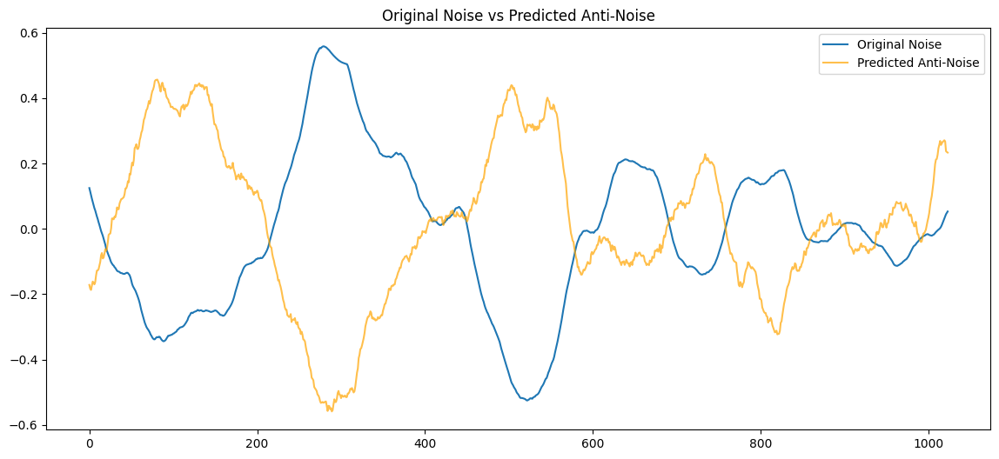

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.06591348 0.0750379  0.09039716 0.09276989 0.09310985 0.0801263
 0.07452575 0.05729583 0.03746798 0.04128085]
Output waveform first 10 values: [ 1.4533225e-02  7.1763024e-03  4.0594302e-04 -2.5071204e-05
 -1.0447204e-03 -5.6493198e-03 -1.0711708e-02 -2.8022375e-02
 -2.5974229e-02 -2.2654831e-02]


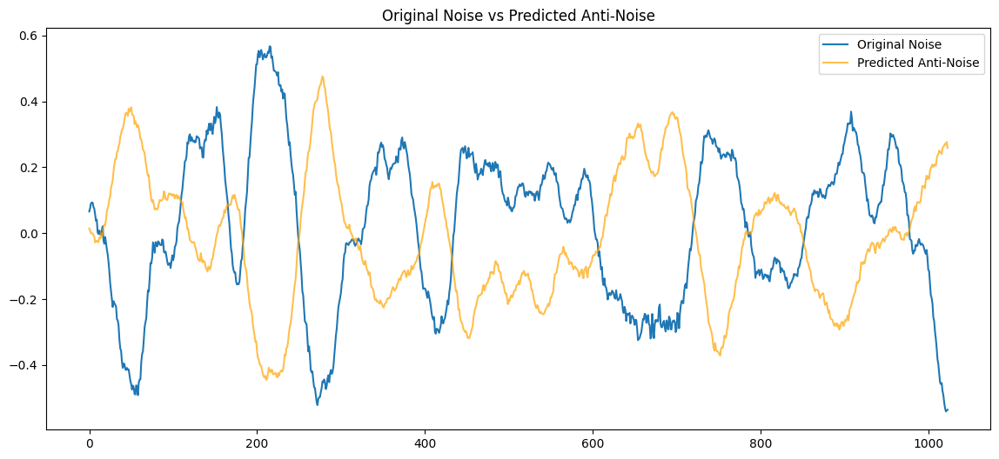

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.01595477 0.01922376 0.0224837  0.02592631 0.02947206 0.0330518
 0.03586219 0.03876503 0.04172745 0.04436507]
Output waveform first 10 values: [0.05940038 0.05577465 0.03838229 0.04662391 0.03799421 0.03978307
 0.05096972 0.03469243 0.04343402 0.05774166]


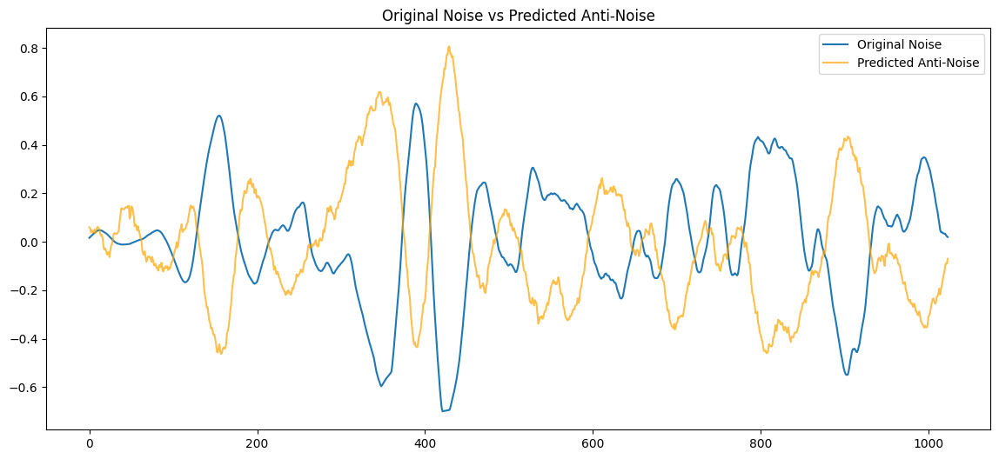

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.09502385 -0.12290988 -0.15125518 -0.1815075  -0.2148611  -0.23905183
 -0.2517263  -0.25957203 -0.25972217 -0.24792497]
Output waveform first 10 values: [0.15862295 0.1645555  0.162634   0.1866834  0.17987381 0.17734443
 0.18599151 0.18372984 0.19688731 0.19828852]


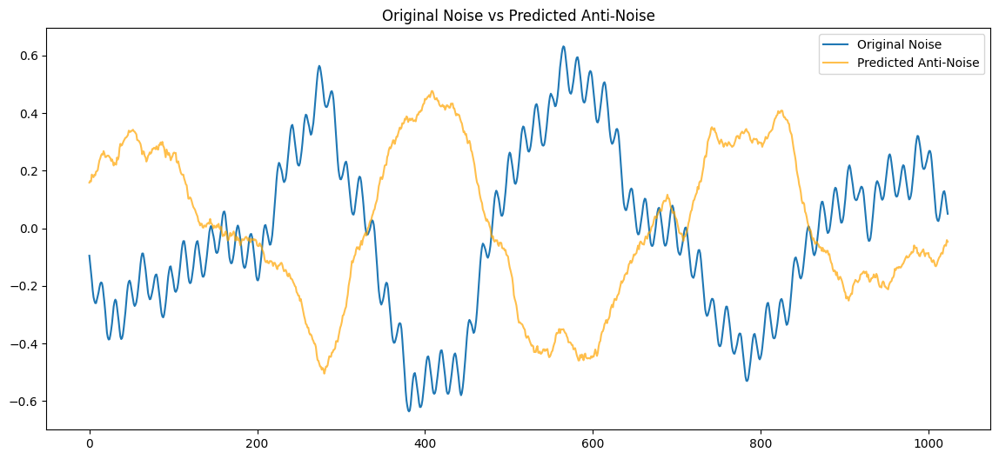

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.41877335 -0.40109172 -0.38286403 -0.37398437 -0.37349018 -0.3540189
 -0.31680226 -0.2889173  -0.28877532 -0.27176437]
Output waveform first 10 values: [0.26633266 0.256683   0.25690514 0.2711291  0.25956142 0.26030335
 0.25622085 0.2383373  0.24548994 0.24602963]


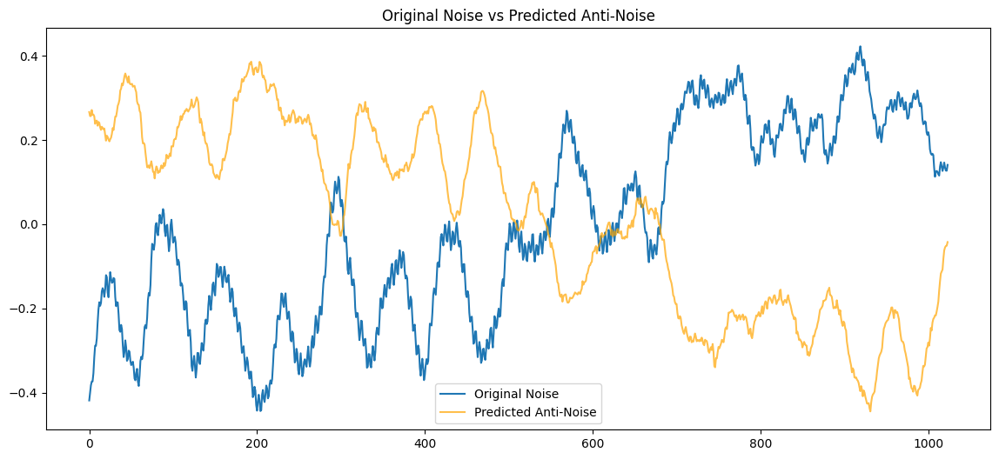

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.3230128  -0.291484   -0.23732789 -0.078187   -0.02078498  0.02463575
  0.01277909  0.07440163  0.16065565  0.15990825]
Output waveform first 10 values: [0.31035432 0.2968562  0.29053336 0.2829659  0.26092342 0.23135793
 0.21954177 0.18698819 0.16380385 0.14454198]


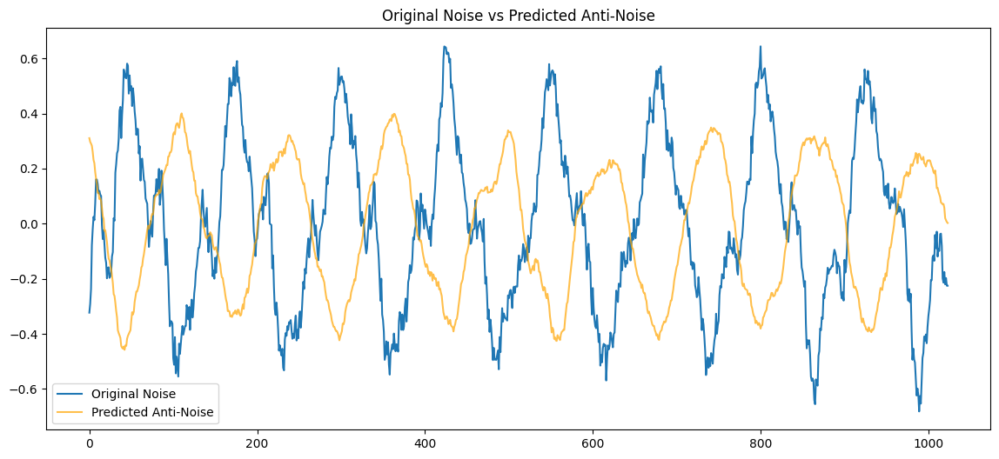

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.34110957 -0.27640203 -0.29308853 -0.3111713  -0.25505146 -0.25870663
 -0.3267656  -0.2196337  -0.18032165 -0.09498062]
Output waveform first 10 values: [0.30940622 0.30048704 0.28808454 0.2965385  0.27449074 0.2664094
 0.25610617 0.23951386 0.22647503 0.22947307]


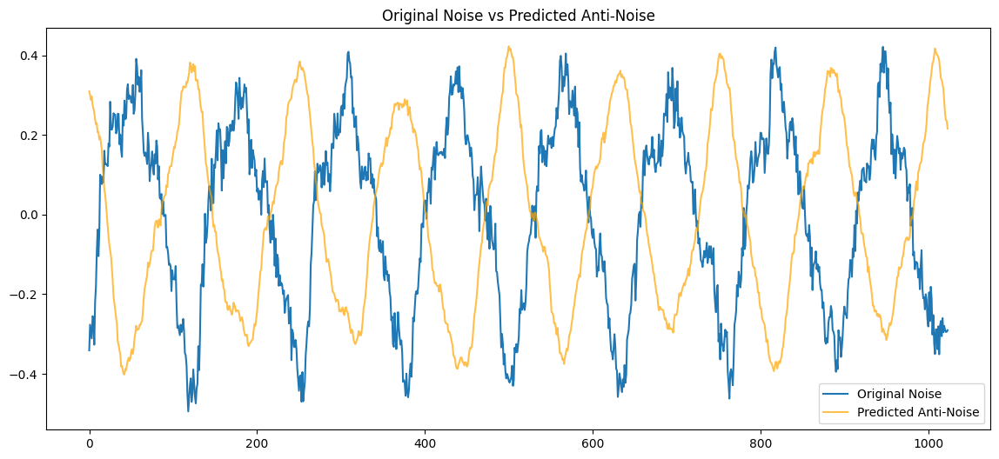

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.0793059  -0.10033295 -0.11860505 -0.1407222  -0.16194093 -0.17708077
 -0.1891527  -0.19469866 -0.20510684 -0.21002   ]
Output waveform first 10 values: [-0.04848541 -0.05569148 -0.0558803  -0.02678791 -0.0525499  -0.05239537
 -0.02817046 -0.04321791 -0.03669218 -0.02193873]


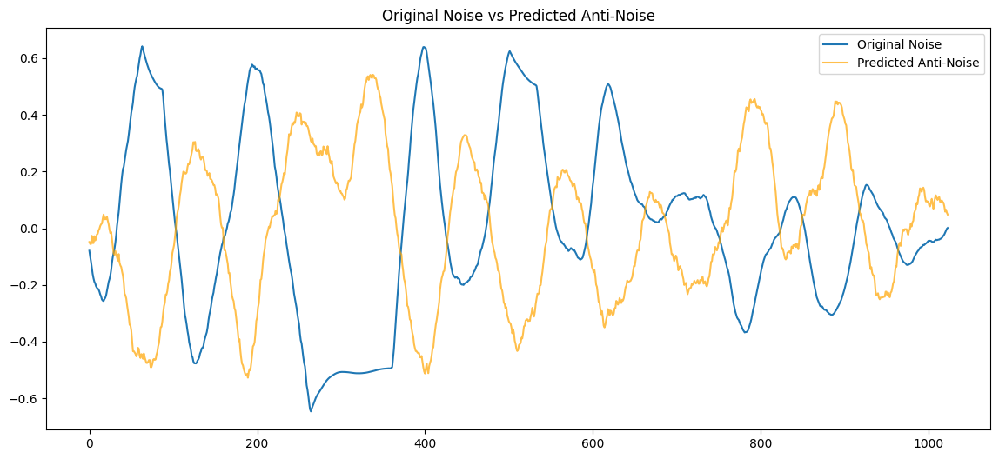

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.26515162 -0.26173705 -0.25052607 -0.2358582  -0.21337333 -0.18479006
 -0.15139398 -0.12205864 -0.09402137 -0.05836011]
Output waveform first 10 values: [-0.10919196 -0.12205999 -0.13658471 -0.13915865 -0.12441006 -0.12404706
 -0.12137631 -0.12346526 -0.09434782 -0.07071752]


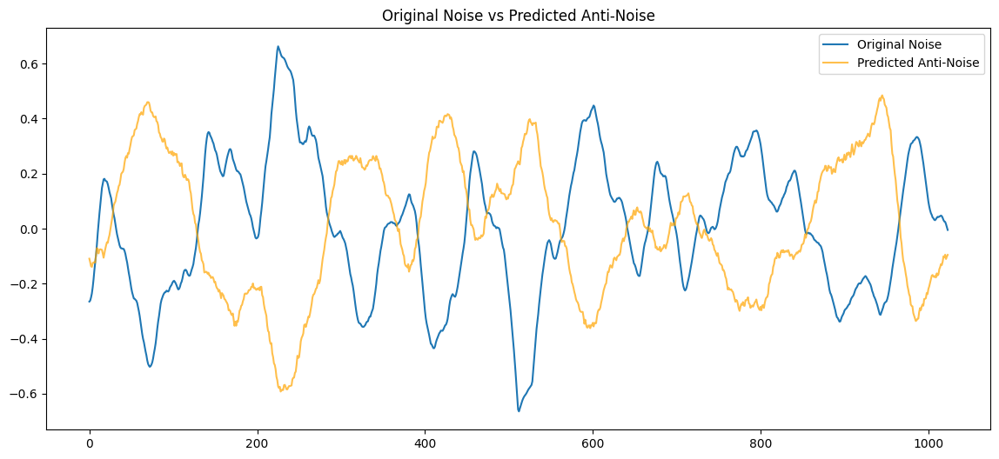

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.13625646 -0.12431882 -0.10989433 -0.10041325 -0.09673256 -0.09100655
 -0.08525874 -0.08496056 -0.08689818 -0.08155946]
Output waveform first 10 values: [0.17775416 0.17904586 0.1732386  0.18108451 0.16712444 0.15213433
 0.15462567 0.13585123 0.12980883 0.12117006]


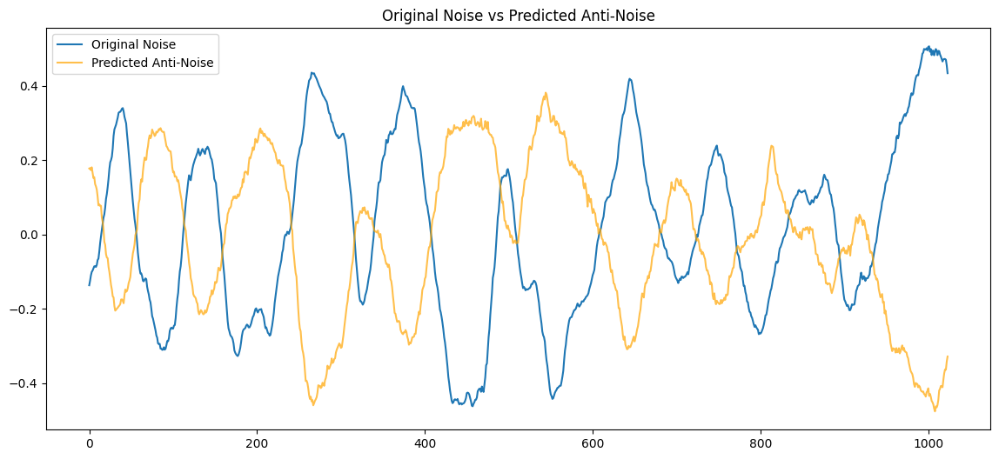

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.29853112 -0.30661148 -0.37938252 -0.38527578 -0.37681583 -0.35500786
 -0.3595936  -0.39422336 -0.39823243 -0.3825312 ]
Output waveform first 10 values: [0.19213814 0.20077722 0.21454337 0.20722972 0.21310028 0.21795125
 0.23631966 0.24480243 0.26226586 0.2681427 ]


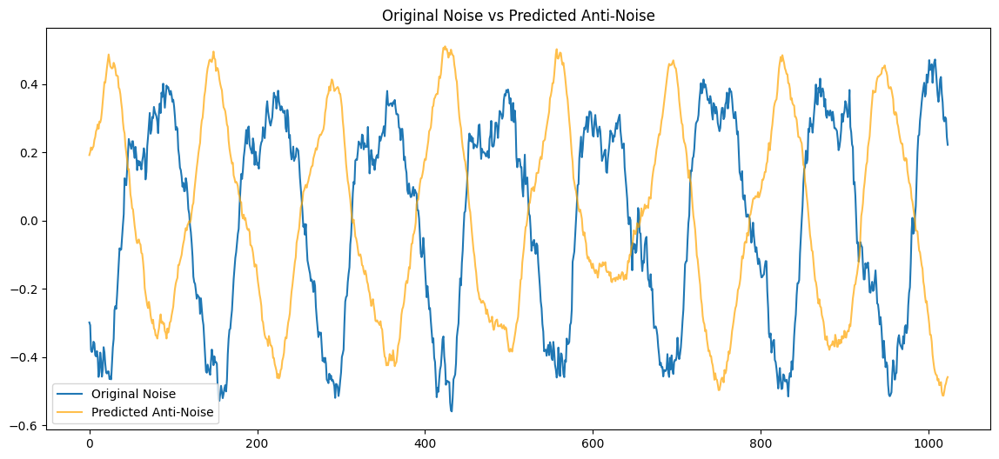

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.482629   -0.48675185 -0.48880765 -0.48882106 -0.48700744 -0.48262656
 -0.47557774 -0.46606743 -0.45726523 -0.44655874]
Output waveform first 10 values: [0.26596907 0.2732205  0.28259504 0.3118093  0.31092378 0.3158374
 0.31825292 0.31167033 0.31863618 0.33587688]


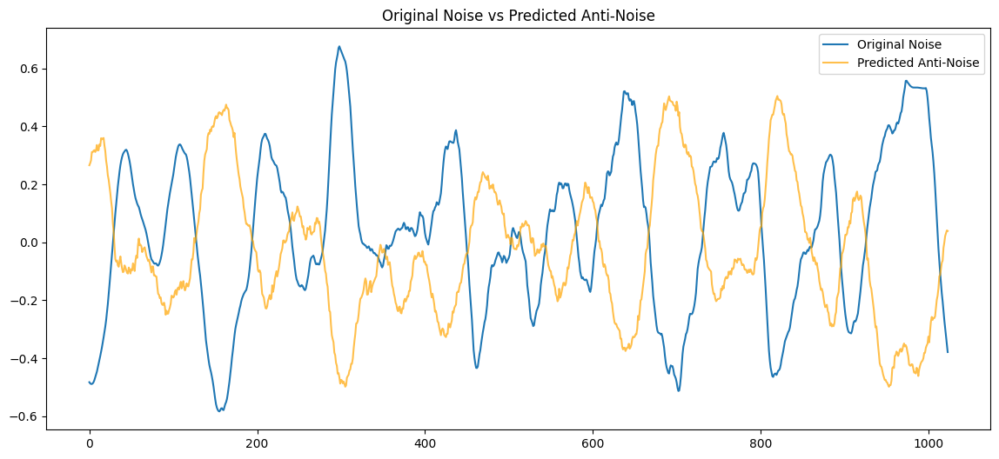

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.37360704 -0.40512124 -0.43906382 -0.48557755 -0.5285254  -0.54867315
 -0.55173635 -0.55356634 -0.55131125 -0.54732746]
Output waveform first 10 values: [0.5808846  0.608117   0.61567616 0.63046503 0.6598507  0.6612525
 0.68592453 0.69224894 0.68738234 0.7077281 ]


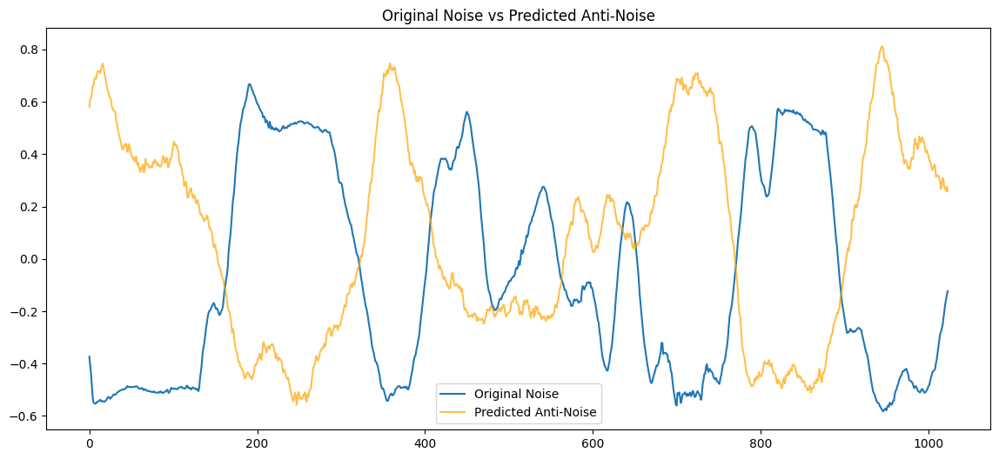

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.06285973 -0.06196379 -0.05792285 -0.05150399 -0.04462069 -0.03856769
 -0.03005619 -0.01944888 -0.00988942 -0.00046824]
Output waveform first 10 values: [ 2.6813857e-03  2.2593886e-05  4.1848961e-03  1.7229689e-02
  1.3816427e-02 -7.3606046e-03  1.1427648e-02 -8.3889160e-04
 -8.4300749e-03 -4.6828594e-03]


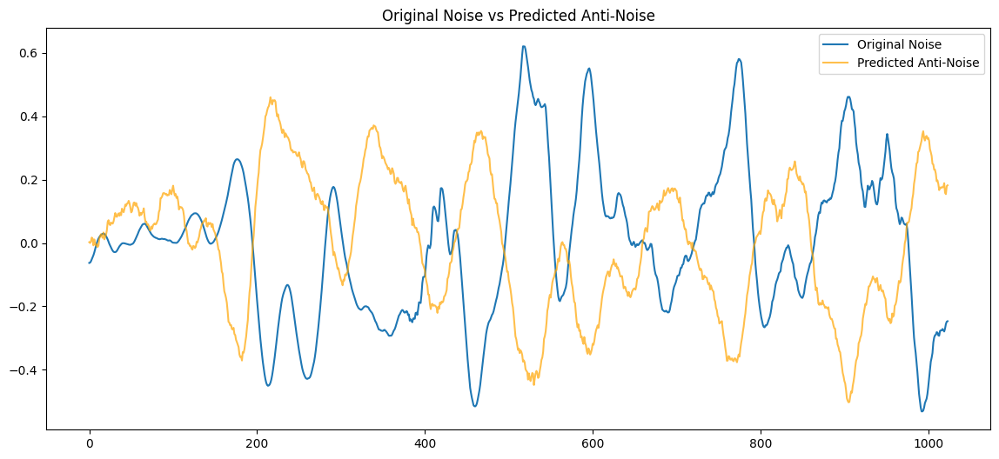

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.40554425 -0.49464867 -0.46915868 -0.43237355 -0.45774606 -0.43688804
 -0.47596046 -0.5633275  -0.5590748  -0.5005806 ]
Output waveform first 10 values: [0.4462357  0.41205278 0.4100854  0.4111228  0.38644892 0.38381073
 0.3931583  0.38393208 0.37493658 0.35487247]


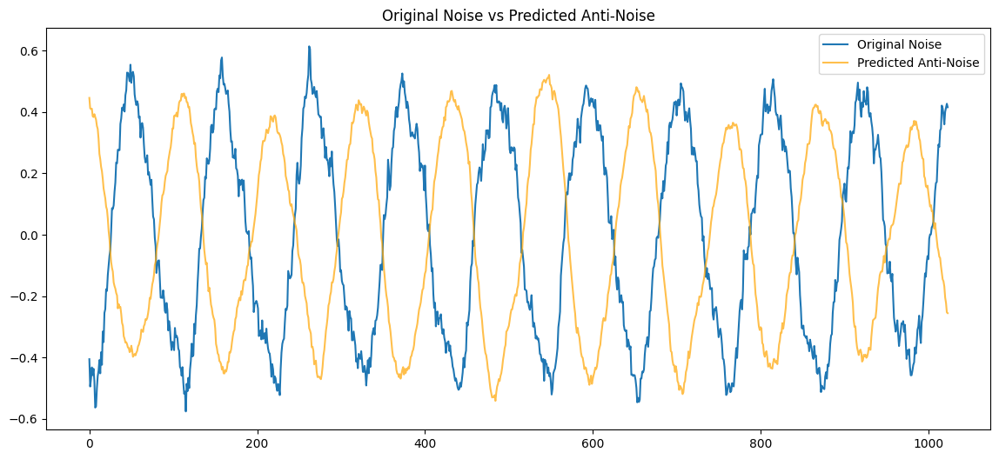

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.43342707 -0.42774773 -0.45531374 -0.47334588 -0.42877567 -0.439962
 -0.40271157 -0.33869553 -0.31898385 -0.32463747]
Output waveform first 10 values: [0.35672867 0.36483237 0.3658938  0.369446   0.3883463  0.41012526
 0.39572483 0.4193295  0.45268306 0.46726298]


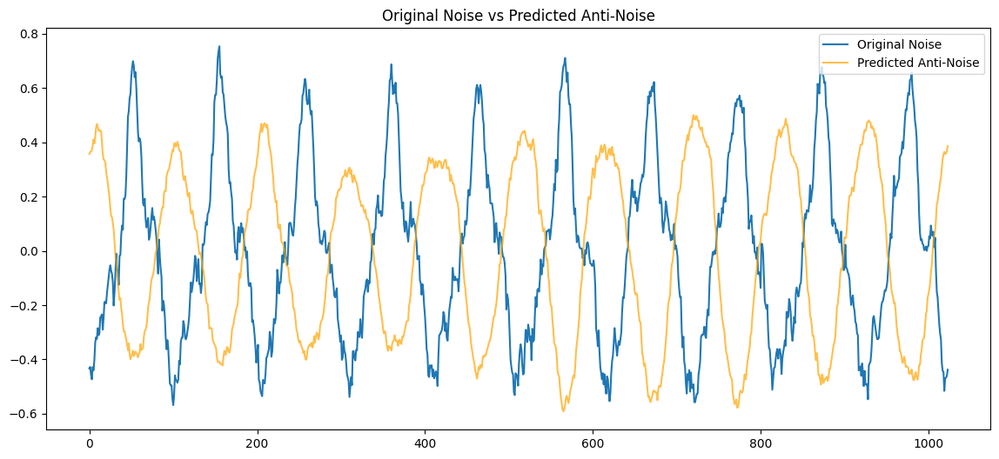

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.3493172  -0.22585781 -0.25709513 -0.3274926  -0.33707768 -0.34228012
 -0.3104084  -0.32556477 -0.40914863 -0.46802244]
Output waveform first 10 values: [0.3304444  0.32614374 0.35514918 0.3904869  0.38598618 0.40238
 0.43854794 0.46169952 0.47258973 0.48175186]


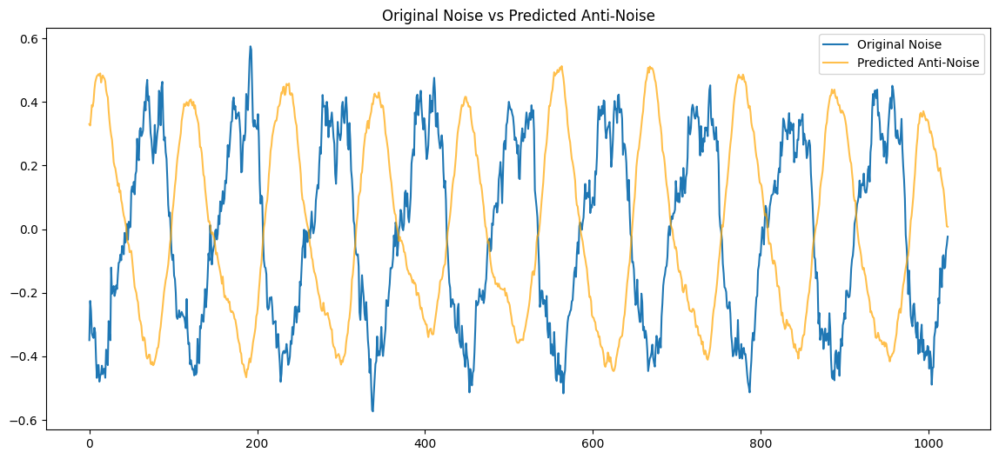

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.04495281 0.04888762 0.05321306 0.05434495 0.06218678 0.07145892
 0.07308295 0.07964015 0.08187304 0.08182566]
Output waveform first 10 values: [ 0.05527467  0.04131576  0.03077926  0.03283786  0.01122681  0.00370037
 -0.00126556 -0.01091636 -0.01525855 -0.01786667]


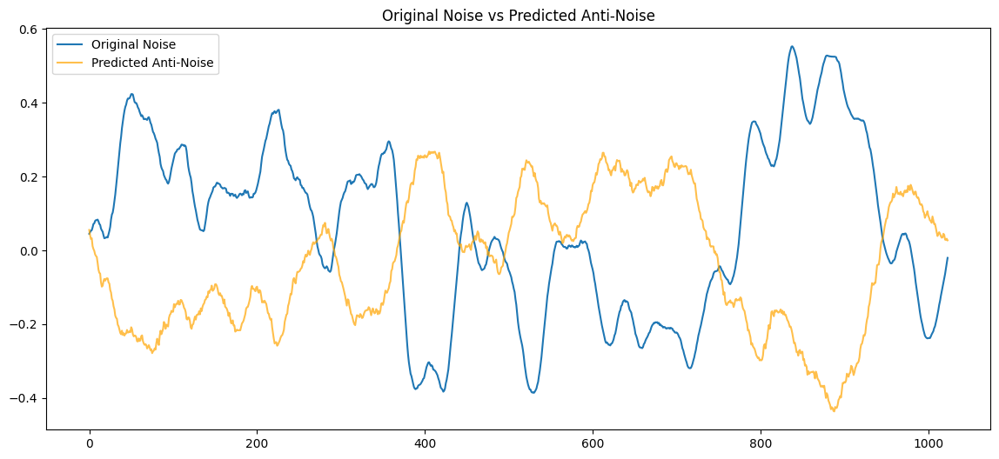

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.17372192 -0.17216755 -0.18174209 -0.18538561 -0.19367197 -0.19088791
 -0.18765588 -0.17847855 -0.16879593 -0.1667107 ]
Output waveform first 10 values: [0.26151523 0.2521624  0.24371007 0.23429097 0.23024437 0.2355376
 0.2199947  0.19880286 0.19972695 0.19587864]


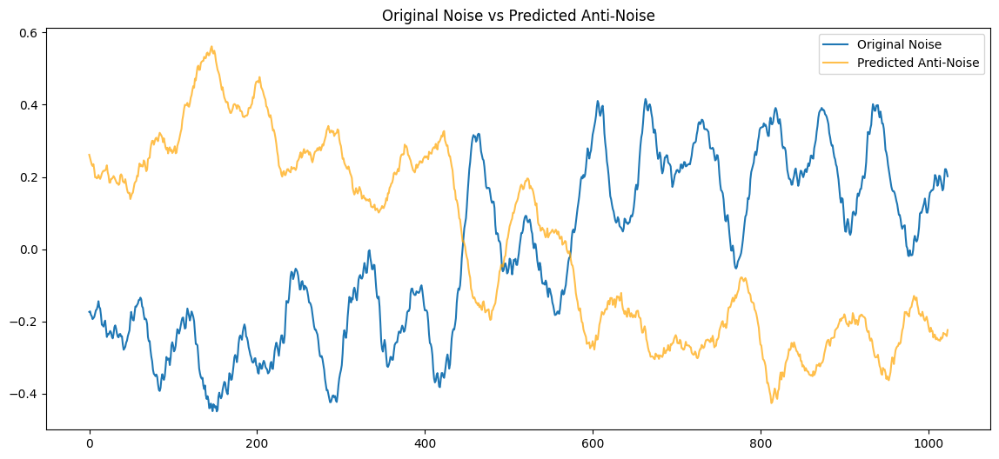

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.4050468  0.47452042 0.46336153 0.47453707 0.42489168 0.4793074
 0.5192237  0.4849781  0.4835928  0.4784422 ]
Output waveform first 10 values: [-0.26794165 -0.2649214  -0.2747571  -0.29506856 -0.29165766 -0.3104522
 -0.3365849  -0.35399228 -0.34832337 -0.35597068]


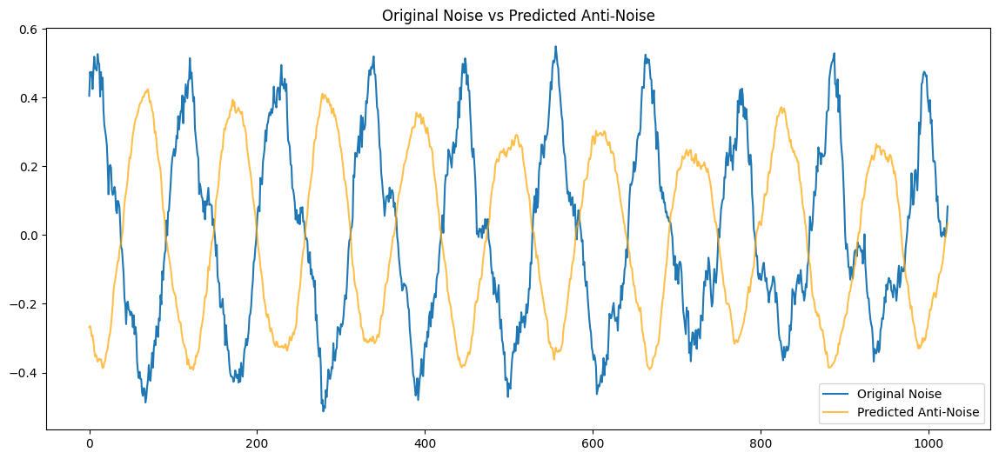

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.07560563 0.15123005 0.23161529 0.18390244 0.1288217  0.17250273
 0.19071539 0.16380337 0.06112225 0.07767349]
Output waveform first 10 values: [-0.17471421 -0.19045357 -0.197391   -0.15869866 -0.11734469 -0.11891256
 -0.07544153 -0.05251757 -0.0311879   0.00779161]


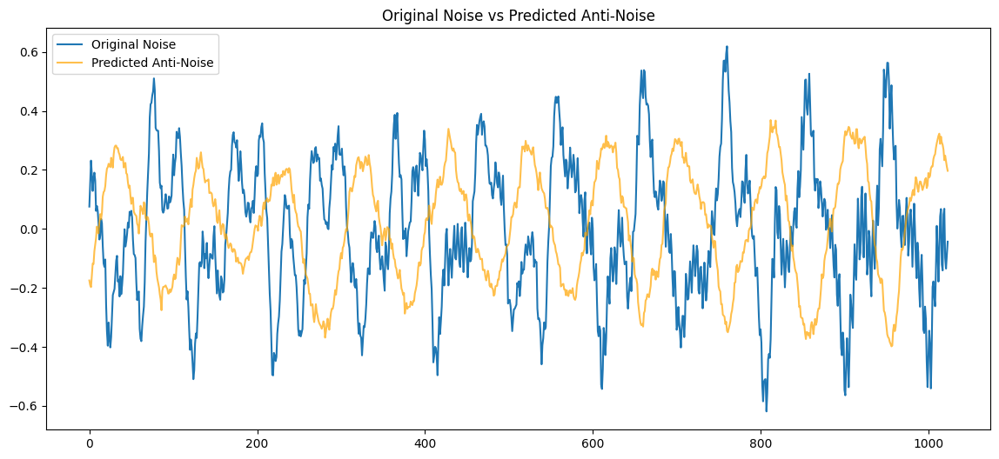

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [ 0.01889487  0.00738732  0.0204932  -0.04072672 -0.05676227 -0.07084499
 -0.13534702 -0.10218664 -0.12046538 -0.10619151]
Output waveform first 10 values: [-0.00429656  0.02071477  0.03302778  0.06575266  0.0774956   0.0997235
  0.13399859  0.14027266  0.16527145  0.1951793 ]


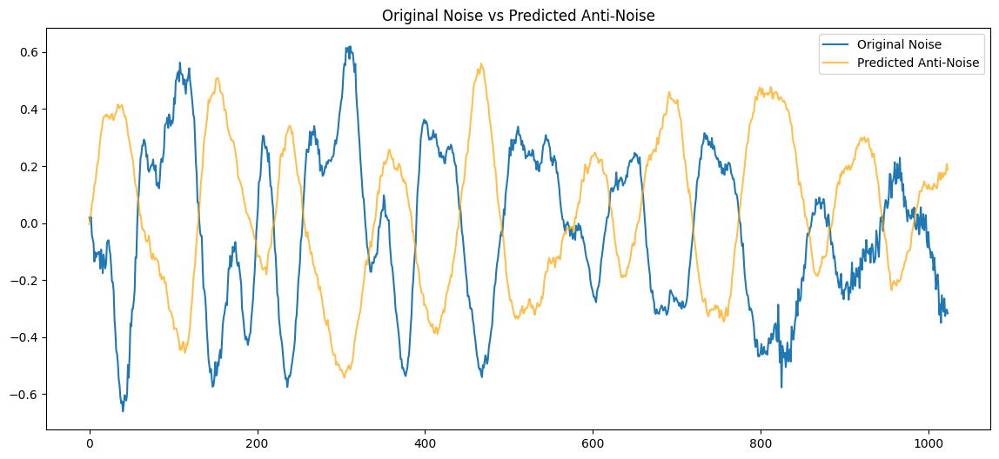

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [0.34319857 0.32459474 0.2974778  0.29918438 0.29843158 0.28658724
 0.2579571  0.23330823 0.22363292 0.20926417]
Output waveform first 10 values: [-0.23781916 -0.26222497 -0.2881999  -0.2744676  -0.29387727 -0.29984194
 -0.29425305 -0.31341547 -0.30950418 -0.2927171 ]


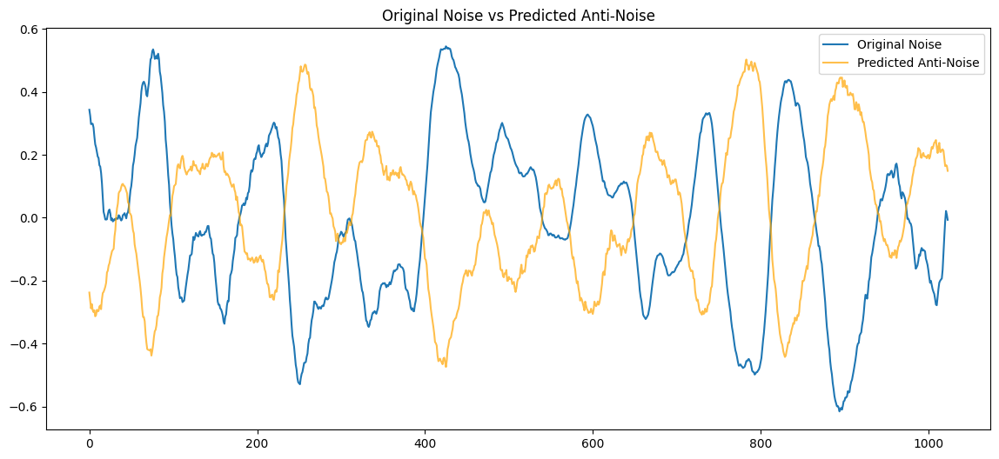

Input waveform shape: (1024,)
Output waveform shape: (1024,)
Input waveform first 10 values: [-0.20464495 -0.20813796 -0.21121497 -0.21880502 -0.20138836 -0.22026078
 -0.26643306 -0.3029505  -0.3890586  -0.45716998]
Output waveform first 10 values: [0.14585978 0.15404284 0.17859036 0.17062417 0.18344031 0.18446197
 0.20311396 0.21027537 0.23414382 0.23587571]


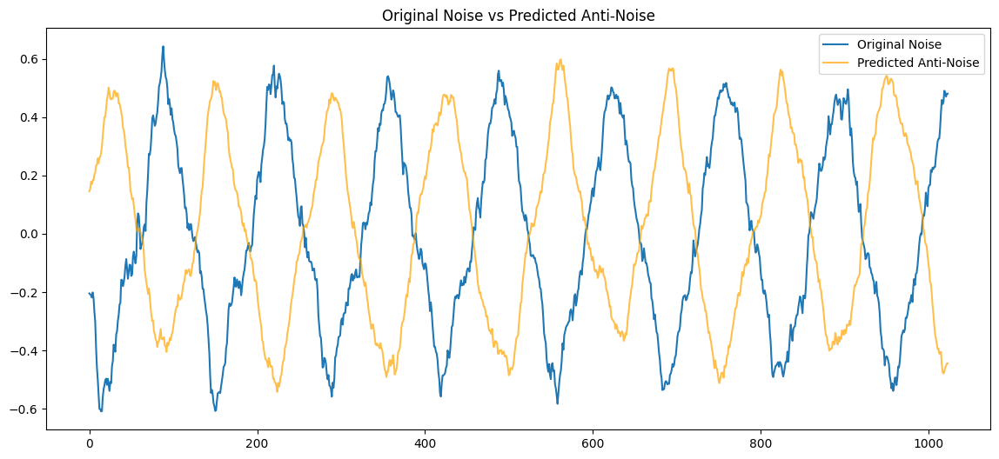

In [38]:
test_folder_path = 'whskrud1007@gmail.com/내 드라이브/136-2.극한 소음 환경 소리 /Users/chonakyung/Library/CloudStorage/GoogleDrive-데이터/01-1.정식개방데이터/Validation/01.원천데이터/VS_02.공사장_03.전자제품및생활환경소리'
test_combined_dataset = load_datasets_from_folder(test_folder_path)

test_dataloader = DataLoader(test_combined_dataset, batch_size = 64, shuffle=True)

evaluate_and_plot_with_dataloader(anti_noise_model, test_dataloader)

# 계산

Recording...
Recording finished.
녹음된 오디오가 recorded_audio.wav에 저장되었습니다.
Recorded audio length: 5.0 seconds
Original Noise RMS: 0.3350
Anti-Noise RMS: 0.1002
Combined Noise RMS: 0.0123
Noise Reduction: 96.34%
결합된 파일이 combined_waveform2.wav에 저장되었습니다.


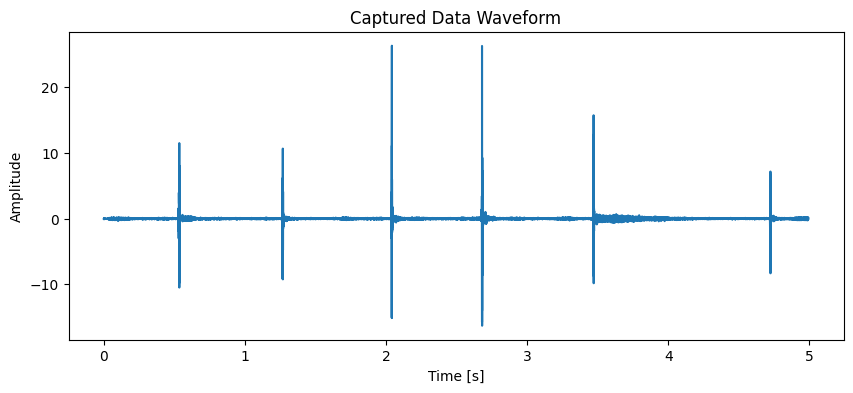

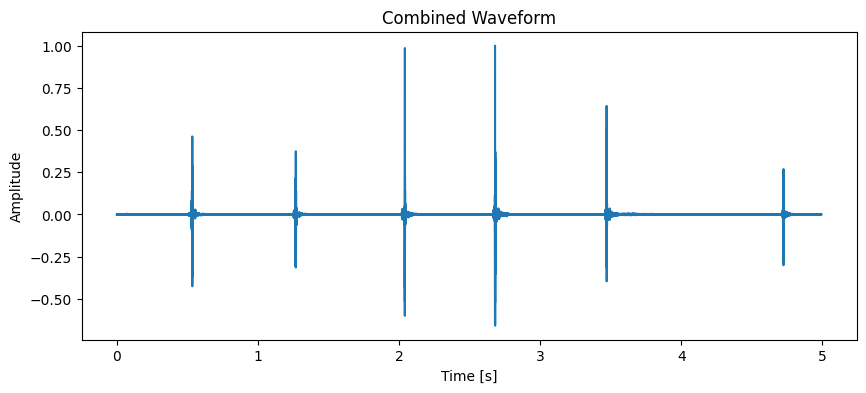

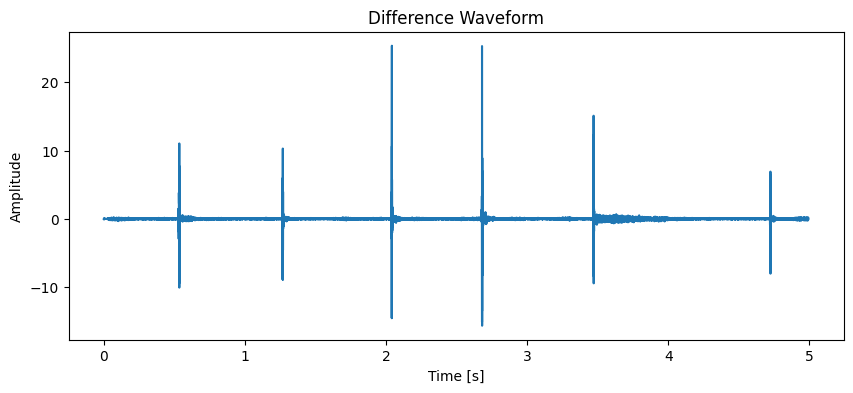

In [43]:
import numpy as np
import sounddevice as sd
import torch
import matplotlib.pyplot as plt
import pickle
import soundfile as sf

# RMS 계산 함수
def calculate_rms(signal):
    return np.sqrt(np.mean(signal**2))

# .pkl 파일에서 모델 로드
with open('/Users/chonakyung/LSTM2/Noise_Lower_LSTM_vol_2.pkl', 'rb') as model_file:
    model = pickle.load(model_file)


def process_and_concatenate(model, input_waveform, frame_size=1024):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    input_waveform = torch.tensor(input_waveform).unsqueeze(0).to(device).float()
    
    output_waveform = []
    
    for i in range(0, input_waveform.size(1), frame_size):
        input_frame = input_waveform[:, i:i+frame_size]
        if input_frame.size(1) == frame_size:
            with torch.no_grad():
                output_frame = model(input_frame).cpu().numpy().flatten()
                output_waveform.append(output_frame)
    
    # 결과를 이어붙이기
    output_waveform = np.concatenate(output_waveform)
    
    return output_waveform

# 시각화 함수
def plot_waveform(data, sample_rate, title):
    time_axis = np.linspace(0, len(data) / sample_rate, num=len(data))
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, data)
    plt.title(title)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

# 오디오 데이터 캡처 및 모델 출력
live_audio_data = capture_and_predict(duration=5)
sample_rate = 44100  # 샘플레이트 지정

# 녹음된 데이터의 길이 확인
recorded_duration = len(live_audio_data) / sample_rate
print(f"Recorded audio length: {recorded_duration} seconds")

# live_audio_data는 2D numpy array로 반환되기 때문에 1D로 변환 필요
live_audio_data = live_audio_data.squeeze()

# 모델 예측 및 결합된 데이터 생성
output_waveform = process_and_concatenate(model, live_audio_data, frame_size=1024)

# 두 데이터의 길이 일치화
min_length = min(len(live_audio_data), len(output_waveform))
original_data = live_audio_data[:min_length]
output_waveform = output_waveform[:min_length]

# 두 파형 결합
combined_data = original_data + output_waveform

# 결합된 데이터의 정규화 (클리핑 방지)
combined_data = combined_data / np.max(np.abs(combined_data))

# RMS 값 계산
rms_original = calculate_rms(original_data)
rms_anti_noise = calculate_rms(output_waveform)
rms_combined = calculate_rms(combined_data)

# 소음 감소율 계산
noise_reduction_percentage = ((rms_original - rms_combined) / rms_original) * 100

# 결과 출력
print(f"Original Noise RMS: {rms_original:.4f}")
print(f"Anti-Noise RMS: {rms_anti_noise:.4f}")
print(f"Combined Noise RMS: {rms_combined:.4f}")
print(f"Noise Reduction: {noise_reduction_percentage:.2f}%")

# 결합된 데이터를 .wav 파일로 저장
output_wav_path = 'combined_waveform2.wav'
sf.write(output_wav_path, combined_data, sample_rate)

print(f"결합된 파일이 {output_wav_path}에 저장되었습니다.")

# 전체 구간에서의 파형 시각화
plot_waveform(original_data, sample_rate, "Captured Data Waveform")
plot_waveform(combined_data, sample_rate, "Combined Waveform")

# 결합 후의 차이 (원본 데이터에 대한 영향도 측정)
difference = original_data - combined_data
plot_waveform(difference, sample_rate, "Difference Waveform")


In [45]:
import soundfile as sf

# 'combined_waveform2.wav' 파일을 로드
output_wav_path = '/Users/chonakyung/LSTM2/combined_waveform2.wav'

# 파일에서 오디오 데이터를 읽음
data, sample_rate = sf.read(output_wav_path)

# 데이터의 길이(샘플 수)를 출력
length_data_points = len(data)
print(f"combined_waveform2.wav 파일의 데이터 길이는 {length_data_points} 포인트입니다.")


combined_waveform2.wav 파일의 데이터 길이는 220160 포인트입니다.


# 실시간 오디오 테스트

Recording...
Recording finished.
Recorded audio length: 5.0 seconds


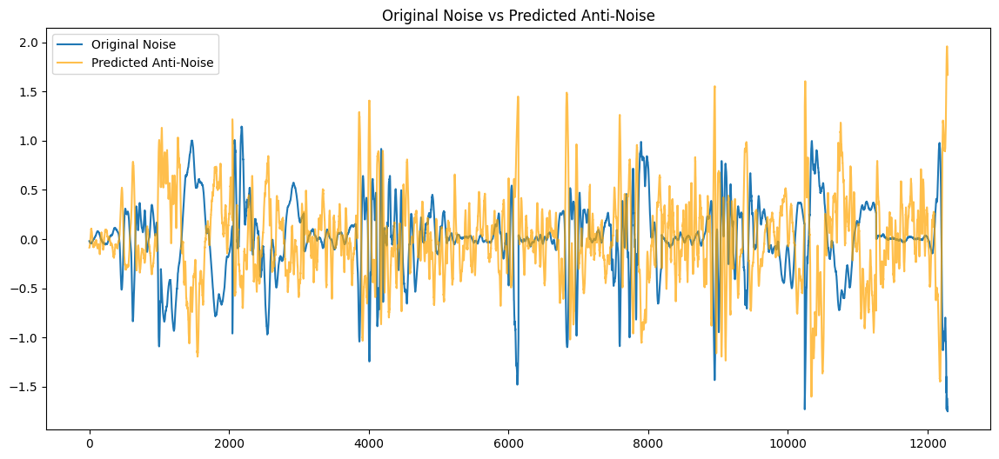

결합된 파일이 combined_waveform.wav에 저장되었습니다.


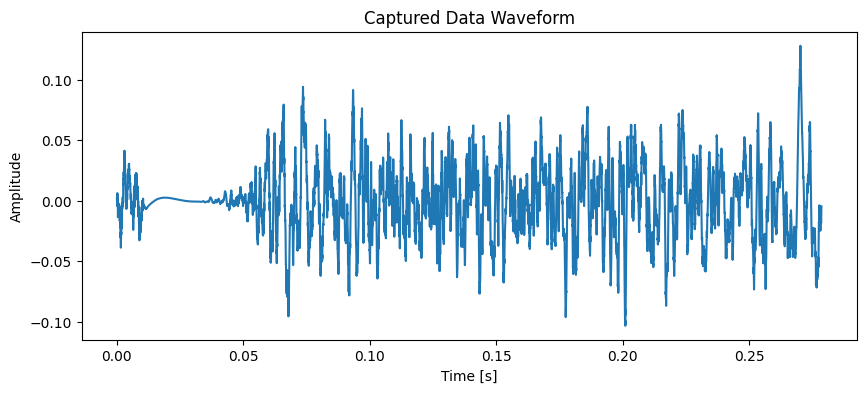

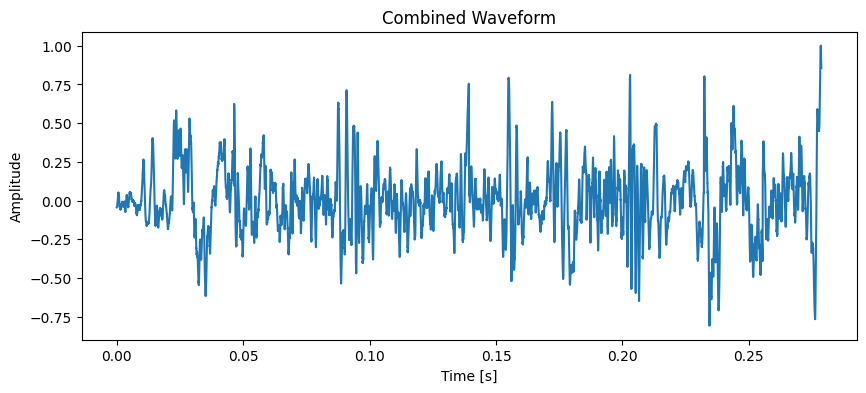

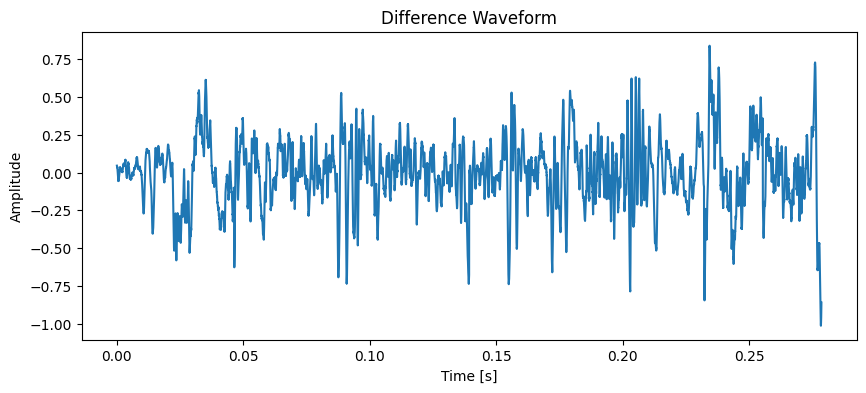

In [14]:
import numpy as np
import sounddevice as sd
import torch
import matplotlib.pyplot as plt
import pickle
import soundfile as sf  # 올바른 모듈 import
from torch.utils.data import DataLoader, Dataset

# .pkl 파일에서 모델 로드
with open('/Users/chonakyung/LSTM2/Noise_Lower_LSTM_vol_1.pkl', 'rb') as model_file:
    model = pickle.load(model_file)

# 오디오 데이터 캡처 및 모델 예측 함수
def capture_and_predict(duration=1, samplerate=44100):
    # 오디오 데이터를 캡처
    print("Recording...")
    audio_data = sd.rec(int(duration * samplerate), samplerate=samplerate, channels=1, dtype='float32')
    sd.wait()  # 녹음 완료까지 대기
    print("Recording finished.")
    
    return audio_data

def evaluate_and_plot_with_dataloader(model, dataloader, total_length):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    all_input_waveforms = []
    all_output_waveforms = []
    
    for inputs, _ in dataloader:
        inputs = inputs.to(device)
        inputs = inputs.squeeze(-1).float()
        with torch.no_grad():
            outputs = model(inputs)
            
        # 각 배치를 평탄화하고 리스트에 추가
        for i in range(inputs.size(0)):
            input_waveform = inputs[i].cpu().numpy().flatten()
            output_waveform = outputs[i].cpu().numpy().flatten()
            all_input_waveforms.append(input_waveform)
            all_output_waveforms.append(output_waveform)
    
    # 모든 배치를 하나의 연속적인 파형으로 결합
    all_input_waveforms = np.concatenate(all_input_waveforms)
    all_output_waveforms = np.concatenate(all_output_waveforms)

    # 필요한 길이만큼 잘라서 시각화 (전체 길이 맞춤)
    all_input_waveforms = all_input_waveforms[:total_length]
    all_output_waveforms = all_output_waveforms[:total_length]
    
    # 결과 시각화
    plt.figure(figsize=(14, 6))
    plt.plot(all_input_waveforms, label='Original Noise')
    plt.plot(all_output_waveforms, label='Predicted Anti-Noise', color='orange', alpha=0.7)
    plt.title('Original Noise vs Predicted Anti-Noise')
    plt.legend()
    plt.show()

    return all_output_waveforms

class NoiseDataset(Dataset):
    def __init__(self, waveform, sample_rate=16000, frame_size=1024, threshold=0.05):
        self.waveform = torch.tensor(waveform)
        self.sample_rate = sample_rate
        self.frame_size = frame_size
        self.threshold = threshold
        self.noise_indices = self._detect_noise(self.waveform)
        
    def _detect_noise(self, waveform):
        noise_indices = []
        waveform_length = waveform.size(0)
        
        for i in range(0, waveform_length - self.frame_size, self.frame_size):
            frame = waveform[i:i+self.frame_size]
            frame_energy = frame.pow(2).mean().item()
            if frame_energy > self.threshold:
                noise_indices.append(i)
                
        return noise_indices

    def __len__(self):
        return len(self.noise_indices)
    
    def __getitem__(self, idx):
        start_idx = self.noise_indices[idx]
        end_idx = start_idx + self.frame_size

        noisy_segment = self.waveform[start_idx:end_idx]
        
        return noisy_segment.unsqueeze(-1), noisy_segment.unsqueeze(-1)

def load_datasets_from_waveform(waveform, sample_rate=16000, frame_size=1024, threshold=0.05):
    dataset = NoiseDataset(waveform, sample_rate, frame_size, threshold)
    return dataset

# 시각화 함수
def plot_waveform(data, sample_rate, title):
    time_axis = np.linspace(0, len(data) / sample_rate, num=len(data))
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, data)
    plt.title(title)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

# 오디오 데이터 캡처 및 모델 출력
live_audio_data = capture_and_predict(duration=5)
sample_rate = 44100  # samplerate 지정

# 녹음된 데이터의 길이 확인
print(f"Recorded audio length: {len(live_audio_data) / sample_rate} seconds")

# live_audio_data는 2D numpy array로 반환되기 때문에 1D로 변환 필요
live_audio_data = live_audio_data.squeeze()

# 노이즈 데이터셋 생성
dataset = load_datasets_from_waveform(live_audio_data, sample_rate=sample_rate)
live_data = DataLoader(dataset, batch_size=64, shuffle=True)

# 모델 예측 및 시각화
output_form = evaluate_and_plot_with_dataloader(model, live_data, total_length=len(live_audio_data))

# 두 데이터의 길이 일치화
min_length = min(len(live_audio_data), len(output_form))
original_data = live_audio_data[:min_length]
output_form = output_form[:min_length]

# 두 파형 결합
combined_data = original_data + output_form

# 결합된 데이터의 정규화 (클리핑 방지)
combined_data = combined_data / np.max(np.abs(combined_data))

# 결합된 데이터를 .wav 파일로 저장
output_wav_path = 'combined_waveform.wav'
sf.write(output_wav_path, combined_data, sample_rate)

print(f"결합된 파일이 {output_wav_path}에 저장되었습니다.")


# 전체 구간에서의 파형 시각화
plot_waveform(original_data, sample_rate, "Captured Data Waveform")
plot_waveform(combined_data, sample_rate, "Combined Waveform")

# 결합 후의 차이 (원본 데이터에 대한 영향도 측정)
difference = original_data - combined_data
plot_waveform(difference, sample_rate, "Difference Waveform")


In [44]:
import numpy as np
import sounddevice as sd
import torch
import matplotlib.pyplot as plt
import pickle
import soundfile as sf  # 올바른 모듈 import
from torch.utils.data import DataLoader, Dataset

def get_audio_length(file_path):
    data, sample_rate = sf.read(file_path)
    duration = len(data) / sample_rate
    return duration

recorded_audio_path = '/Users/chonakyung/LSTM2/recorded_audio.wav' 

recorded_audio_length = get_audio_length(recorded_audio_path)
print(f"Recorded audio length: {recorded_audio_length:.2f} seconds")


Recorded audio length: 5.00 seconds


Recording...
Recording finished.
Recorded audio length: 5.0 seconds


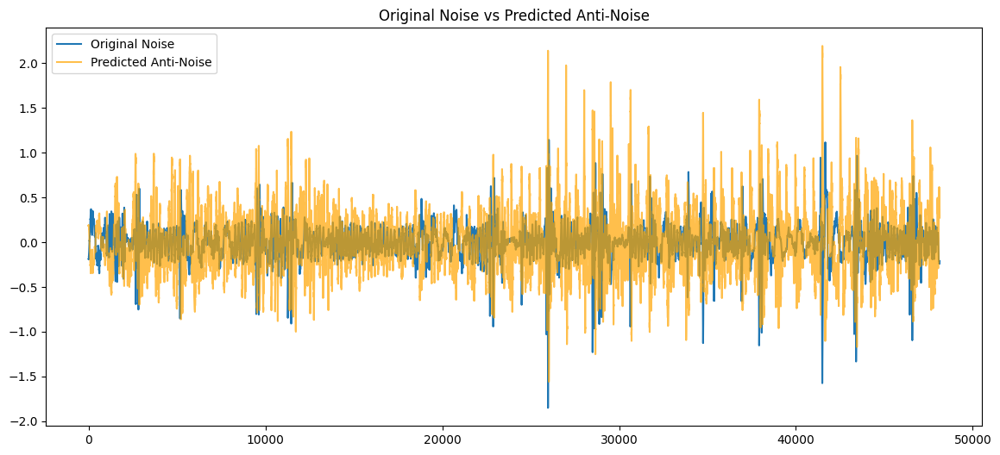

결합된 파일이 combined_waveform.wav에 저장되었습니다.


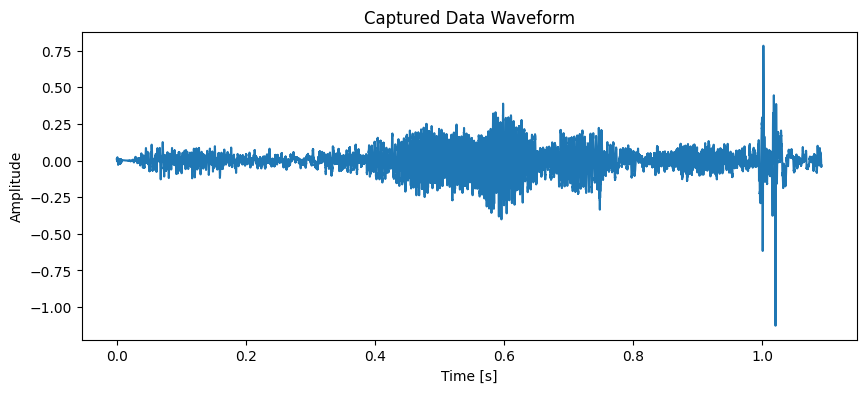

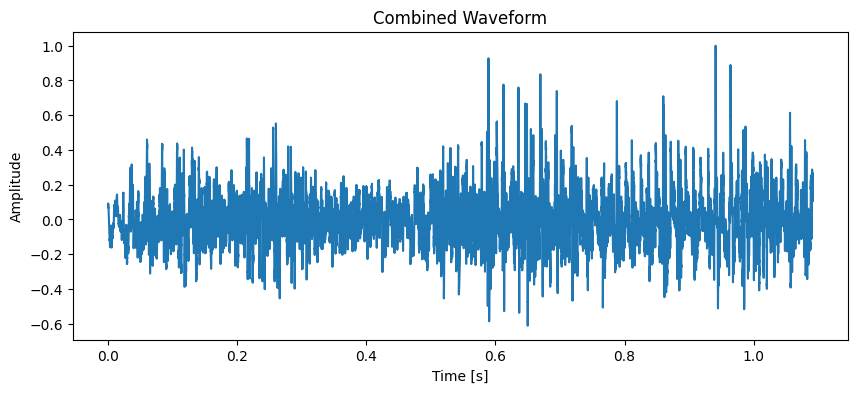

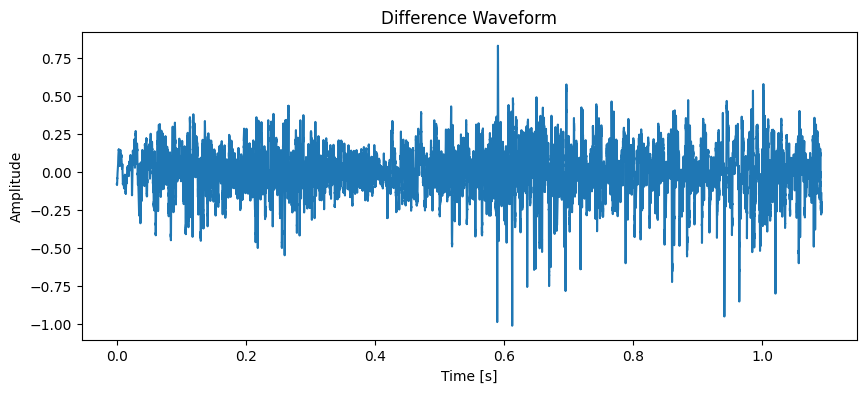

In [19]:
import numpy as np
import sounddevice as sd
import torch
import matplotlib.pyplot as plt
import pickle
import soundfile as sf
from torch.utils.data import DataLoader, Dataset

# .pkl 파일에서 모델 로드
with open('/Users/chonakyung/LSTM2/Noise_Lower_LSTM_vol_2.pkl', 'rb') as model_file:
    model = pickle.load(model_file)

# 오디오 데이터 캡처 함수
def capture_and_predict(duration=5, samplerate=44100):
    # 오디오 데이터를 캡처
    print("Recording...")
    audio_data = sd.rec(int(duration * samplerate), samplerate=samplerate, channels=1, dtype='float32')
    sd.wait()  # 녹음 완료까지 대기
    print("Recording finished.")
    
    return audio_data

def evaluate_and_plot_with_dataloader(model, dataloader, total_length):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    all_input_waveforms = []
    all_output_waveforms = []
    
    for inputs, _ in dataloader:
        inputs = inputs.to(device)
        inputs = inputs.squeeze(-1).float()
        with torch.no_grad():
            outputs = model(inputs)
            
        # 각 배치를 평탄화하고 리스트에 추가
        for i in range(inputs.size(0)):
            input_waveform = inputs[i].cpu().numpy().flatten()
            output_waveform = outputs[i].cpu().numpy().flatten()
            all_input_waveforms.append(input_waveform)
            all_output_waveforms.append(output_waveform)
    
    # 모든 배치를 하나의 연속적인 파형으로 결합
    all_input_waveforms = np.concatenate(all_input_waveforms)
    all_output_waveforms = np.concatenate(all_output_waveforms)

    # 필요한 길이만큼 잘라서 시각화 (전체 길이 맞춤)
    all_input_waveforms = all_input_waveforms[:total_length]
    all_output_waveforms = all_output_waveforms[:total_length]
    
    # 결과 시각화
    plt.figure(figsize=(14, 6))
    plt.plot(all_input_waveforms, label='Original Noise')
    plt.plot(all_output_waveforms, label='Predicted Anti-Noise', color='orange', alpha=0.7)
    plt.title('Original Noise vs Predicted Anti-Noise')
    plt.legend()
    plt.show()

    return all_output_waveforms

class NoiseDataset(Dataset):
    def __init__(self, waveform, sample_rate=16000, frame_size=1024, threshold=0.05):
        self.waveform = torch.tensor(waveform)
        self.sample_rate = sample_rate
        self.frame_size = frame_size
        self.threshold = threshold
        self.noise_indices = self._detect_noise(self.waveform)
        
    def _detect_noise(self, waveform):
        noise_indices = []
        waveform_length = waveform.size(0)
        
        for i in range(0, waveform_length - self.frame_size, self.frame_size):
            frame = waveform[i:i+self.frame_size]
            frame_energy = frame.pow(2).mean().item()
            if frame_energy > self.threshold:
                noise_indices.append(i)
                
        return noise_indices

    def __len__(self):
        return len(self.noise_indices)
    
    def __getitem__(self, idx):
        start_idx = self.noise_indices[idx]
        end_idx = start_idx + self.frame_size

        noisy_segment = self.waveform[start_idx:end_idx]
        
        return noisy_segment.unsqueeze(-1), noisy_segment.unsqueeze(-1)

def load_datasets_from_waveform(waveform, sample_rate=16000, frame_size=1024, threshold=0.05):
    dataset = NoiseDataset(waveform, sample_rate, frame_size, threshold)
    return dataset

# 시각화 함수
def plot_waveform(data, sample_rate, title):
    time_axis = np.linspace(0, len(data) / sample_rate, num=len(data))
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, data)
    plt.title(title)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

# 오디오 데이터 캡처 및 모델 출력
live_audio_data = capture_and_predict(duration=5)
sample_rate = 44100  # 샘플레이트 지정

# 녹음된 데이터의 길이 확인
recorded_duration = len(live_audio_data) / sample_rate
print(f"Recorded audio length: {recorded_duration} seconds")

# live_audio_data는 2D numpy array로 반환되기 때문에 1D로 변환 필요
live_audio_data = live_audio_data.squeeze()

# 노이즈 데이터셋 생성
dataset = load_datasets_from_waveform(live_audio_data, sample_rate=sample_rate,threshold= 0.01)
live_data = DataLoader(dataset, batch_size=64, shuffle=True)

# 모델 예측 및 시각화
output_form = evaluate_and_plot_with_dataloader(model, live_data, total_length=len(live_audio_data))

# 두 데이터의 길이 일치화
min_length = min(len(live_audio_data), len(output_form))
original_data = live_audio_data[:min_length]
output_form = output_form[:min_length]

# 두 파형 결합
combined_data = original_data + output_form

# 결합된 데이터의 정규화 (클리핑 방지)
combined_data = combined_data / np.max(np.abs(combined_data))

# 결합된 데이터를 .wav 파일로 저장
output_wav_path = 'combined_waveform.wav'
sf.write(output_wav_path, combined_data, sample_rate)

print(f"결합된 파일이 {output_wav_path}에 저장되었습니다.")

# 전체 구간에서의 파형 시각화
plot_waveform(original_data, sample_rate, "Captured Data Waveform")
plot_waveform(combined_data, sample_rate, "Combined Waveform")

# 결합 후의 차이 (원본 데이터에 대한 영향도 측정)
difference = original_data - combined_data
plot_waveform(difference, sample_rate, "Difference Waveform")


Recording...
Recording finished.
녹음된 오디오가 recorded_audio.wav에 저장되었습니다.
Recorded audio length: 5.0 seconds
결합된 파일이 combined_waveform2.wav에 저장되었습니다.


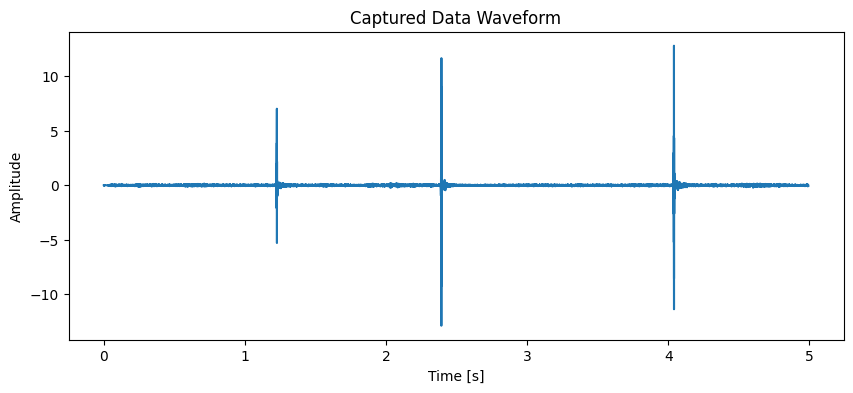

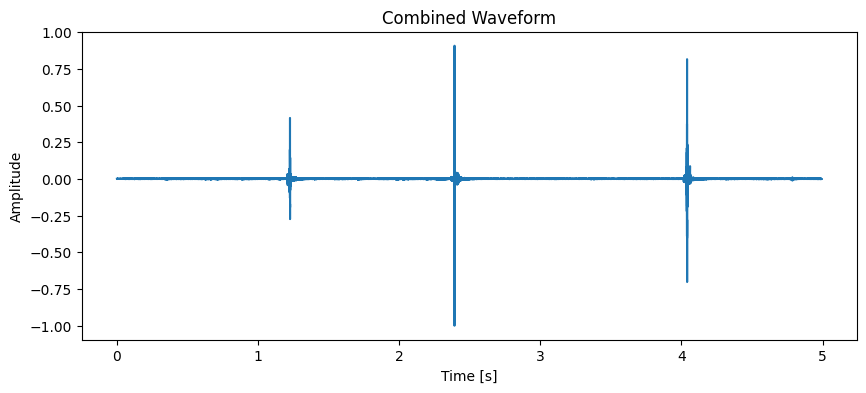

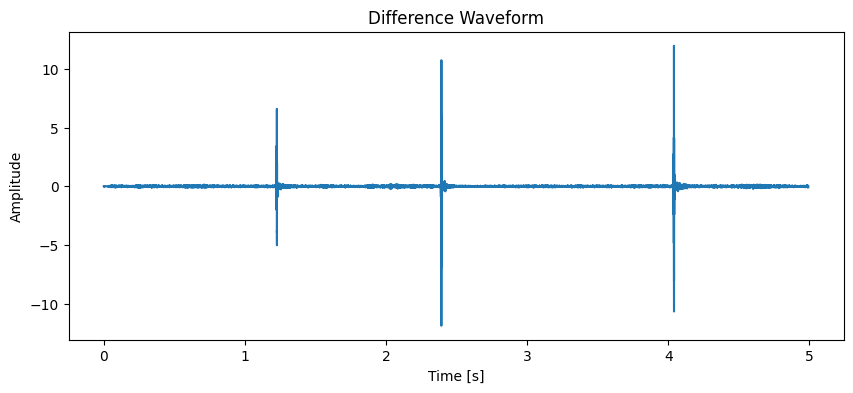

In [23]:
import numpy as np
import sounddevice as sd
import torch
import matplotlib.pyplot as plt
import pickle
import soundfile as sf
from torch.utils.data import DataLoader, Dataset

# .pkl 파일에서 모델 로드
with open('/Users/chonakyung/LSTM2/Noise_Lower_LSTM_vol_2.pkl', 'rb') as model_file:
    model = pickle.load(model_file)

# 오디오 데이터 캡처 함수
def capture_and_predict(duration=5, samplerate=44100):
    # 오디오 데이터를 캡처
    print("Recording...")
    audio_data = sd.rec(int(duration * samplerate), samplerate=samplerate, channels=1, dtype='float32')
    sd.wait()  # 녹음 완료까지 대기
    print("Recording finished.")

    # 녹음된 오디오 데이터를 .wav 파일로 저장
    original_wav_path = 'recorded_audio.wav'
    sf.write(original_wav_path, audio_data, samplerate)
    print(f"녹음된 오디오가 {original_wav_path}에 저장되었습니다.")
    
    return audio_data

def process_and_concatenate(model, input_waveform, frame_size=1024):
    model.eval()
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    
    input_waveform = torch.tensor(input_waveform).unsqueeze(0).to(device).float()
    
    output_waveform = []
    
    for i in range(0, input_waveform.size(1), frame_size):
        input_frame = input_waveform[:, i:i+frame_size]
        if input_frame.size(1) == frame_size:
            with torch.no_grad():
                output_frame = model(input_frame).cpu().numpy().flatten()
                output_waveform.append(output_frame)
    
    # 결과를 이어붙이기
    output_waveform = np.concatenate(output_waveform)
    
    return output_waveform

# 시각화 함수
def plot_waveform(data, sample_rate, title):
    time_axis = np.linspace(0, len(data) / sample_rate, num=len(data))
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, data)
    plt.title(title)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

# 오디오 데이터 캡처 및 모델 출력
live_audio_data = capture_and_predict(duration=5)
sample_rate = 44100  # 샘플레이트 지정

# 녹음된 데이터의 길이 확인
recorded_duration = len(live_audio_data) / sample_rate
print(f"Recorded audio length: {recorded_duration} seconds")

# live_audio_data는 2D numpy array로 반환되기 때문에 1D로 변환 필요
live_audio_data = live_audio_data.squeeze()

# 모델 예측 및 결합된 데이터 생성
output_waveform = process_and_concatenate(model, live_audio_data, frame_size=1024)

# 두 데이터의 길이 일치화
min_length = min(len(live_audio_data), len(output_waveform))
original_data = live_audio_data[:min_length]
output_waveform = output_waveform[:min_length]

# 두 파형 결합
combined_data = original_data + output_waveform

# 결합된 데이터의 정규화 (클리핑 방지)
combined_data = combined_data / np.max(np.abs(combined_data))

# 결합된 데이터를 .wav 파일로 저장
output_wav_path = 'combined_waveform2.wav'
sf.write(output_wav_path, combined_data, sample_rate)

print(f"결합된 파일이 {output_wav_path}에 저장되었습니다.")

# 전체 구간에서의 파형 시각화
plot_waveform(original_data, sample_rate, "Captured Data Waveform")
plot_waveform(combined_data, sample_rate, "Combined Waveform")

# 결합 후의 차이 (원본 데이터에 대한 영향도 측정)
difference = original_data - combined_data
plot_waveform(difference, sample_rate, "Difference Waveform")


Recording...
Recording finished.
Recorded audio length: 5.0 seconds


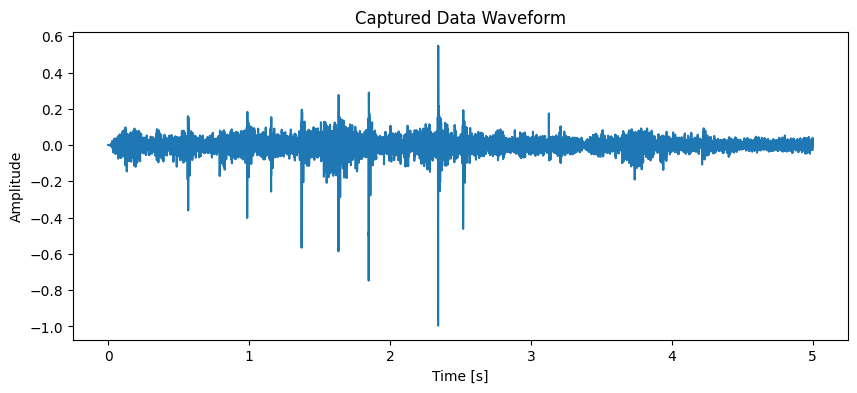

In [16]:
import numpy as np
import sounddevice as sd
import matplotlib.pyplot as plt

# 오디오 데이터 캡처 함수
def capture_and_predict(duration=5, samplerate=44100):
    # 오디오 데이터를 캡처
    print("Recording...")
    audio_data = sd.rec(int(duration * samplerate), samplerate=samplerate, channels=1, dtype='float32')
    sd.wait()  # 녹음 완료까지 대기
    print("Recording finished.")
    
    return audio_data

# 시각화 함수
def plot_waveform(data, sample_rate, title):
    time_axis = np.linspace(0, len(data) / sample_rate, num=len(data))
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, data)
    plt.title(title)
    plt.xlabel("Time [s]")
    plt.ylabel("Amplitude")
    plt.show()

# 오디오 데이터 캡처
duration = 5  # 5초간 녹음
sample_rate = 44100  # 샘플링 레이트 설정
live_audio_data = capture_and_predict(duration=duration, samplerate=sample_rate)

# 녹음된 데이터의 길이 확인
recorded_duration = len(live_audio_data) / sample_rate
print(f"Recorded audio length: {recorded_duration} seconds")

# live_audio_data는 2D numpy array로 반환되기 때문에 1D로 변환 필요
live_audio_data = live_audio_data.squeeze()

# 캡처된 데이터 시각화
plot_waveform(live_audio_data, sample_rate, "Captured Data Waveform")
